# Explainable Change-Aware Building Damage Assessment from Bi-Temporal Satellite Imagery

## Final full-data Kaggle notebook targeting 80%+ in-domain accuracy

**Dataset:** xBD/xView2  
**Kaggle access route:** `tunguz/xview2-challenge-dataset-train-and-test`

This notebook implements a four-class, building-level damage assessment system using paired pre-disaster and post-disaster satellite imagery.

### Accuracy statement

The notebook is designed to **target** 80% or higher test accuracy under a leakage-safe, in-domain scene-grouped protocol. A fixed score cannot be guaranteed before the experiment is run. The actual result depends on dataset composition, crop quality, pretrained-weight availability, GPU runtime and optimisation.

The default `EXPERIMENT_MODE = "in_domain"`:

- allows the same disaster domain to occur across train, validation and test;
- prevents the same satellite `scene_id` from crossing split boundaries;
- preserves the natural damage-class distribution;
- reports accuracy with balanced accuracy, macro-F1 and per-class recall.

Set `EXPERIMENT_MODE = "cross_event"` for the harder unseen-disaster evaluation. Do not describe the in-domain result as unseen-disaster generalisation.

### Original approach

The friend's Gemini demonstration reported 75% on only four matched images from one disaster. This notebook does not copy that code or evaluation. It uses a scalable supervised experiment with:

1. post-only ConvNeXt-Tiny baseline;
2. nine-channel change-stack ConvNeXt using pre, post and absolute difference;
3. Siamese change-aware ConvNeXt using signed change, absolute change and feature interaction;
4. staged transfer learning;
5. paired augmentation and MixUp;
6. test-time augmentation;
7. validation-optimised soft-voting ensemble.

### UREC1 coverage

- secondary xBD/xView2 data only;
- no human participants, interviews, surveys or personal data;
- detailed EDA and paired building-crop preprocessing;
- baseline versus change-aware model comparison;
- macro-F1, balanced accuracy, per-class recall and confusion matrices;
- Grad-CAM technical diagnostics only;
- saved TorchScript model and Flask application package;
- non-commercial academic use, attribution and no raw-data redistribution.


In [1]:
# ============================================================
# 1. Install only packages that may be missing
# ============================================================
import sys, subprocess, importlib.util

def ensure_package(package, import_name=None):
    import_name = import_name or package
    if importlib.util.find_spec(import_name) is None:
        subprocess.check_call([sys.executable, '-m', 'pip', 'install', '-q', package])

ensure_package('kagglehub')
ensure_package('shapely')

In [2]:
# ============================================================
# 2. Imports, seed and hardware
# ============================================================
import os, gc, json, math, time, random, shutil, warnings
from pathlib import Path
from collections import Counter
from contextlib import nullcontext

import numpy as np
import pandas as pd
from PIL import Image, ImageDraw, ImageEnhance
import matplotlib.pyplot as plt

from shapely import wkt
from shapely.geometry import Polygon, MultiPolygon

from sklearn.model_selection import (
    GroupShuffleSplit,
    train_test_split,
)
try:
    from sklearn.model_selection import StratifiedGroupKFold
except ImportError:
    StratifiedGroupKFold = None
from sklearn.metrics import (
    accuracy_score, balanced_accuracy_score, f1_score, precision_score,
    recall_score, classification_report, confusion_matrix,
    matthews_corrcoef, cohen_kappa_score, roc_auc_score, roc_curve,
    precision_recall_curve, average_precision_score
)
from sklearn.preprocessing import label_binarize
from sklearn.utils.class_weight import compute_class_weight

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import models
from tqdm.auto import tqdm

warnings.filterwarnings('ignore')
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)
    torch.backends.cudnn.benchmark = True

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Python:', sys.version)
print('PyTorch:', torch.__version__)
print('Device:', DEVICE)
if DEVICE.type == 'cuda':
    print('GPU:', torch.cuda.get_device_name(0))
    print('VRAM GB:', round(torch.cuda.get_device_properties(0).total_memory / 1e9, 2))

Python: 3.12.13 (main, Mar  4 2026, 09:23:07) [GCC 11.4.0]
PyTorch: 2.10.0+cu128
Device: cuda
GPU: Tesla T4
VRAM GB: 15.64


In [3]:
# ============================================================
# PyTorch 2.6+ checkpoint compatibility
# ============================================================
def load_local_checkpoint(checkpoint_path, map_location=None):
    checkpoint_path = Path(checkpoint_path)

    if not checkpoint_path.exists():
        raise FileNotFoundError(
            f"Checkpoint not found: {checkpoint_path}"
        )

    if map_location is None:
        resolved_location = globals().get(
            "DEVICE",
            torch.device(
                "cuda" if torch.cuda.is_available() else "cpu"
            ),
        )
    else:
        resolved_location = map_location

    try:
        return torch.load(
            checkpoint_path,
            map_location=resolved_location,
            weights_only=True,
        )
    except TypeError:
        return torch.load(
            checkpoint_path,
            map_location=resolved_location,
        )
    except Exception as restricted_error:
        print(
            "Restricted loading failed for this notebook's own checkpoint. "
            "Retrying with weights_only=False."
        )
        print("Restricted-loader details:", restricted_error)

        return torch.load(
            checkpoint_path,
            map_location=resolved_location,
            weights_only=False,
        )


In [4]:
# ============================================================
# 3. Configuration — final 80%+ accuracy target experiment
# ============================================================
EXPERIMENT_MODE = "in_domain"   # "in_domain" or "cross_event"
ACCURACY_TARGET = 0.80

FORCE_REBUILD_CROPS = False
USE_PRETRAINED = True
RESUME_EXISTING_CHECKPOINTS = False
NUM_WORKERS = 0

DAMAGE_CLASSES = [
    "no-damage",
    "minor-damage",
    "major-damage",
    "destroyed",
]
LABEL_TO_ID = {
    name: index
    for index, name in enumerate(DAMAGE_CLASSES)
}
ID_TO_LABEL = {
    index: name
    for name, index in LABEL_TO_ID.items()
}

IMG_SIZE = 256
CONTEXT_PADDING = 0.30
MIN_POLYGON_SIDE = 5
MIN_CROP_SIDE = 16

MAX_SCENES_PER_DISASTER = None
MAX_BUILDINGS_PER_CLASS_PER_DISASTER = 5000
MAX_TOTAL_BUILDINGS = 60000

BATCH_SIZE = 12
HEAD_EPOCHS = 2
FINE_TUNE_EPOCHS = 10
FULL_FINE_TUNE_EPOCHS = 5
EARLY_STOPPING_PATIENCE = 4

HEAD_LEARNING_RATE = 8e-4
BACKBONE_LEARNING_RATE = 2e-5
FULL_LEARNING_RATE = 7e-6
WEIGHT_DECAY = 1e-4

MIXUP_PROBABILITY = 0.20
MIXUP_ALPHA = 0.25
USE_TTA = True

PROJECT_DIR = Path(
    f"/kaggle/working/xbd_80plus_accuracy_{EXPERIMENT_MODE}"
)
FIG_DIR = PROJECT_DIR / "figures"
TABLE_DIR = PROJECT_DIR / "tables"
CROP_DIR = PROJECT_DIR / "building_crops"
MODEL_DIR = PROJECT_DIR / "models"
FLASK_DIR = PROJECT_DIR / "flask_package"

for path in [
    PROJECT_DIR,
    FIG_DIR,
    TABLE_DIR,
    CROP_DIR,
    MODEL_DIR,
    FLASK_DIR,
]:
    path.mkdir(parents=True, exist_ok=True)

print("Output directory:", PROJECT_DIR)
print("Experiment mode:", EXPERIMENT_MODE)
print("Accuracy target:", ACCURACY_TARGET)
print("Enable GPU and Internet for pretrained ConvNeXt weights.")


Output directory: /kaggle/working/xbd_80plus_accuracy_in_domain
Experiment mode: in_domain
Accuracy target: 0.8
Enable GPU and Internet for pretrained ConvNeXt weights.


## A. Dataset discovery and scene-level audit

The code first searches `/kaggle/input`. If the dataset was not attached to the notebook, it attempts the approved Kaggle mirror through `kagglehub`.

In [5]:
# ============================================================
# 4. Locate labelled xBD images and JSON annotations
# ============================================================
DATASET_SLUG = 'tunguz/xview2-challenge-dataset-train-and-test'

def find_labelled_root(search_roots):
    candidates = []
    for root in search_roots:
        root = Path(root)
        if not root.exists():
            continue
        for images_dir in root.rglob('images'):
            labels_dir = images_dir.parent / 'labels'
            if not labels_dir.exists():
                continue
            pre_count = len(list(images_dir.glob('*_pre_disaster.png')))
            json_count = len(list(labels_dir.glob('*_post_disaster.json')))
            if pre_count and json_count:
                candidates.append((json_count, pre_count, images_dir, labels_dir))
    if not candidates:
        return None
    candidates.sort(reverse=True, key=lambda x: (x[0], x[1]))
    return candidates[0]

found = find_labelled_root(['/kaggle/input'])
if found is None:
    print('Dataset not found in Kaggle input; trying kagglehub...')
    import kagglehub
    downloaded = kagglehub.dataset_download(DATASET_SLUG)
    found = find_labelled_root([downloaded])

if found is None:
    raise FileNotFoundError(
        "Attach the Kaggle dataset 'xView2 Challenge Dataset - train and test'."
    )

POST_JSON_COUNT, PRE_IMAGE_COUNT, IMAGES_DIR, LABELS_DIR = found
DATA_ROOT = IMAGES_DIR.parent
print('Data root:', DATA_ROOT)
print('Images:', IMAGES_DIR)
print('Labels:', LABELS_DIR)
print('Pre images:', PRE_IMAGE_COUNT)
print('Post label JSON:', POST_JSON_COUNT)

Data root: /kaggle/input/datasets/tunguz/xview2-challenge-dataset-train-and-test/train/train
Images: /kaggle/input/datasets/tunguz/xview2-challenge-dataset-train-and-test/train/train/images
Labels: /kaggle/input/datasets/tunguz/xview2-challenge-dataset-train-and-test/train/train/labels
Pre images: 2799
Post label JSON: 2799


In [6]:
# ============================================================
# 5. xBD parsing and image-audit helpers
# ============================================================
DAMAGE_COLORS = {
    'no-damage': (46, 204, 113, 120),
    'minor-damage': (52, 152, 219, 130),
    'major-damage': (243, 156, 18, 140),
    'destroyed': (231, 76, 60, 150),
    'un-classified': (149, 165, 166, 100),
}

def read_json(path):
    with open(path, 'r', encoding='utf-8') as f:
        return json.load(f)

def disaster_from_name(path):
    return Path(path).name.split('_')[0]

def scene_id_from_json(path):
    return Path(path).stem.replace('_post_disaster', '')

def paired_paths(post_json):
    scene_id = scene_id_from_json(post_json)
    return (
        IMAGES_DIR / f'{scene_id}_pre_disaster.png',
        IMAGES_DIR / f'{scene_id}_post_disaster.png',
        LABELS_DIR / f'{scene_id}_pre_disaster.json',
        Path(post_json),
    )

def get_subtype(feature):
    return feature.get('properties', {}).get('subtype', 'un-classified')

def parse_polygon(feature):
    try:
        geom = wkt.loads(feature['wkt'])
        if isinstance(geom, MultiPolygon):
            geom = max(geom.geoms, key=lambda g: g.area)
        if not isinstance(geom, Polygon):
            return None
        if not geom.is_valid:
            geom = geom.buffer(0)
        return None if geom.is_empty else geom
    except Exception:
        return None

def black_fraction(path, size=(96, 96)):
    arr = np.asarray(Image.open(path).convert('RGB').resize(size))
    return float((arr.sum(axis=2) == 0).mean())

def brightness_contrast(path, size=(96, 96)):
    arr = np.asarray(Image.open(path).convert('RGB').resize(size), dtype=np.float32)
    gray = arr.mean(axis=2)
    return float(gray.mean()), float(gray.std())

In [7]:
# ============================================================
# 6. Build scene and polygon metadata tables
# ============================================================
post_json_paths = sorted(LABELS_DIR.glob('*_post_disaster.json'))
scene_records, polygon_records = [], []

for json_path in tqdm(post_json_paths, desc='Parsing annotations'):
    try:
        data = read_json(json_path)
        pre_img, post_img, _, _ = paired_paths(json_path)
        if not pre_img.exists() or not post_img.exists():
            continue

        metadata = data.get('metadata', {})
        features = data.get('features', {}).get('xy', [])
        counts = Counter()
        areas = []

        for feature in features:
            label = get_subtype(feature)
            counts[label] += 1
            poly = parse_polygon(feature)
            if poly is None:
                continue
            minx, miny, maxx, maxy = poly.bounds
            areas.append(float(poly.area))
            if label in DAMAGE_CLASSES:
                polygon_records.append({
                    'scene_id': scene_id_from_json(json_path),
                    'disaster': disaster_from_name(json_path),
                    'damage_label': label,
                    'polygon_area': float(poly.area),
                    'bbox_width': float(maxx - minx),
                    'bbox_height': float(maxy - miny),
                })

        row = {
            'scene_id': scene_id_from_json(json_path),
            'disaster': disaster_from_name(json_path),
            'post_json_path': str(json_path),
            'pre_image_path': str(pre_img),
            'post_image_path': str(post_img),
            'building_count': sum(counts[c] for c in DAMAGE_CLASSES),
            'unclassified_count': counts['un-classified'],
            'mean_polygon_area': np.mean(areas) if areas else np.nan,
            'median_polygon_area': np.median(areas) if areas else np.nan,
            'gsd': metadata.get('gsd', np.nan),
            'off_nadir_angle': metadata.get('off_nadir_angle', np.nan),
            'sun_elevation': metadata.get('sun_elevation', np.nan),
            'sensor': metadata.get('sensor', metadata.get('provider_asset_type', 'unknown')),
        }
        for cls in DAMAGE_CLASSES:
            row[cls] = counts[cls]
        scene_records.append(row)
    except Exception as exc:
        print('Skipped', json_path.name, exc)

scene_df = pd.DataFrame(scene_records)
polygon_df = pd.DataFrame(polygon_records)
for col in ['gsd', 'off_nadir_angle', 'sun_elevation']:
    scene_df[col] = pd.to_numeric(scene_df[col], errors='coerce')

scene_df.to_csv(TABLE_DIR / 'scene_metadata.csv', index=False)
polygon_df.to_csv(TABLE_DIR / 'polygon_metadata.csv', index=False)
print('Scenes:', scene_df.shape)
print('Polygons:', polygon_df.shape)
display(scene_df.head())

Parsing annotations:   0%|          | 0/2799 [00:00<?, ?it/s]

Scenes: (2799, 17)
Polygons: (159794, 6)


,scene_id,disaster,post_json_path,pre_image_path,post_image_path,building_count,unclassified_count,mean_polygon_area,median_polygon_area,gsd,off_nadir_angle,sun_elevation,sensor,no-damage,minor-damage,major-damage,destroyed
0,guatemala-volcano_00000000,guatemala-volcano,/kaggle/input/datasets/tunguz/xview2-challenge...,/kaggle/input/datasets/tunguz/xview2-challenge...,/kaggle/input/datasets/tunguz/xview2-challenge...,10,0,1520.555012,584.062364,1.408524,21.97336,71.182274,WORLDVIEW03_VNIR,10,0,0,0
1,guatemala-volcano_00000001,guatemala-volcano,/kaggle/input/datasets/tunguz/xview2-challenge...,/kaggle/input/datasets/tunguz/xview2-challenge...,/kaggle/input/datasets/tunguz/xview2-challenge...,4,0,597.695873,576.115369,1.408524,21.97336,71.182274,WORLDVIEW03_VNIR,0,4,0,0
2,guatemala-volcano_00000002,guatemala-volcano,/kaggle/input/datasets/tunguz/xview2-challenge...,/kaggle/input/datasets/tunguz/xview2-challenge...,/kaggle/input/datasets/tunguz/xview2-challenge...,1,0,2395.839914,2395.839914,1.408524,21.97336,71.182274,WORLDVIEW03_VNIR,0,0,0,1
3,guatemala-volcano_00000006,guatemala-volcano,/kaggle/input/datasets/tunguz/xview2-challenge...,/kaggle/input/datasets/tunguz/xview2-challenge...,/kaggle/input/datasets/tunguz/xview2-challenge...,97,0,441.882735,374.032217,1.408524,21.97336,71.182274,WORLDVIEW03_VNIR,97,0,0,0
4,guatemala-volcano_00000007,guatemala-volcano,/kaggle/input/datasets/tunguz/xview2-challenge...,/kaggle/input/datasets/tunguz/xview2-challenge...,/kaggle/input/datasets/tunguz/xview2-challenge...,9,0,1015.370195,663.351529,1.408524,21.97336,71.182274,WORLDVIEW03_VNIR,9,0,0,0


## B. Detailed exploratory data analysis

The following figures analyse event representation, damage imbalance, disaster-specific class proportions, polygon geometry, image quality, satellite metadata and paired visual change.

In [8]:
# ============================================================
# 7. EDA summary
# ============================================================
summary_df = pd.DataFrame({
    'measure': ['Labelled scenes', 'Disaster events', 'Annotated buildings'] + DAMAGE_CLASSES,
    'value': [
        len(scene_df), scene_df['disaster'].nunique(),
        int(scene_df[DAMAGE_CLASSES].sum().sum())
    ] + [int(scene_df[c].sum()) for c in DAMAGE_CLASSES]
})
display(summary_df)
summary_df.to_csv(TABLE_DIR / 'eda_summary.csv', index=False)

,measure,value
0,Labelled scenes,2799
1,Disaster events,10
2,Annotated buildings,159794
3,no-damage,117426
4,minor-damage,14980
5,major-damage,14161
6,destroyed,13227


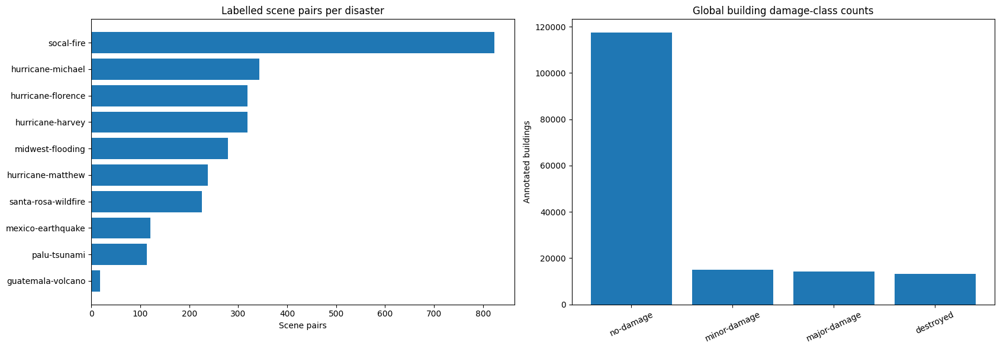

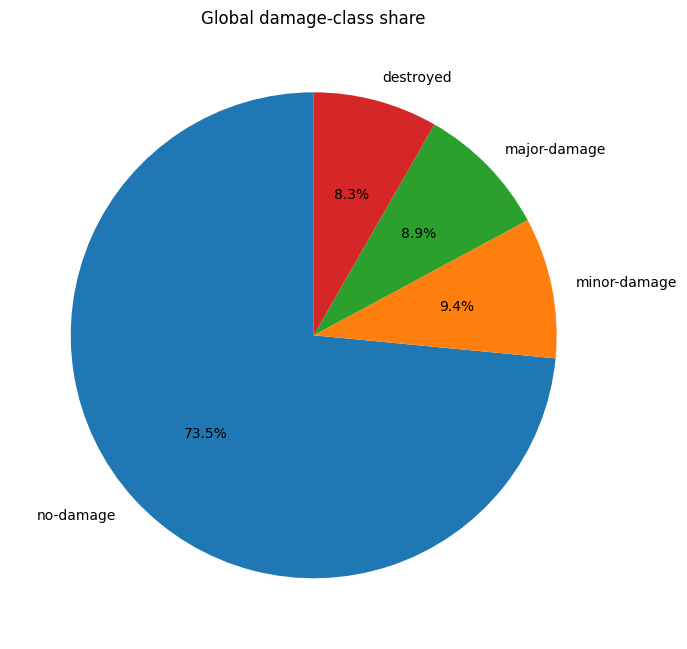

In [9]:
# ============================================================
# 8. EDA: scene counts and global class imbalance
# ============================================================
scene_counts = scene_df['disaster'].value_counts().sort_values()
class_counts = scene_df[DAMAGE_CLASSES].sum().reindex(DAMAGE_CLASSES)

fig, axes = plt.subplots(1, 2, figsize=(17, max(6, 0.35 * len(scene_counts))))
axes[0].barh(scene_counts.index, scene_counts.values)
axes[0].set_title('Labelled scene pairs per disaster')
axes[0].set_xlabel('Scene pairs')

axes[1].bar(class_counts.index, class_counts.values)
axes[1].set_title('Global building damage-class counts')
axes[1].set_ylabel('Annotated buildings')
axes[1].tick_params(axis='x', rotation=25)
plt.tight_layout()
plt.savefig(FIG_DIR / 'eda_scene_and_class_counts.png', dpi=160)
plt.show()

plt.figure(figsize=(7, 7))
plt.pie(class_counts.values, labels=class_counts.index, autopct='%1.1f%%', startangle=90)
plt.title('Global damage-class share')
plt.tight_layout()
plt.savefig(FIG_DIR / 'eda_class_share_pie.png', dpi=160)
plt.show()

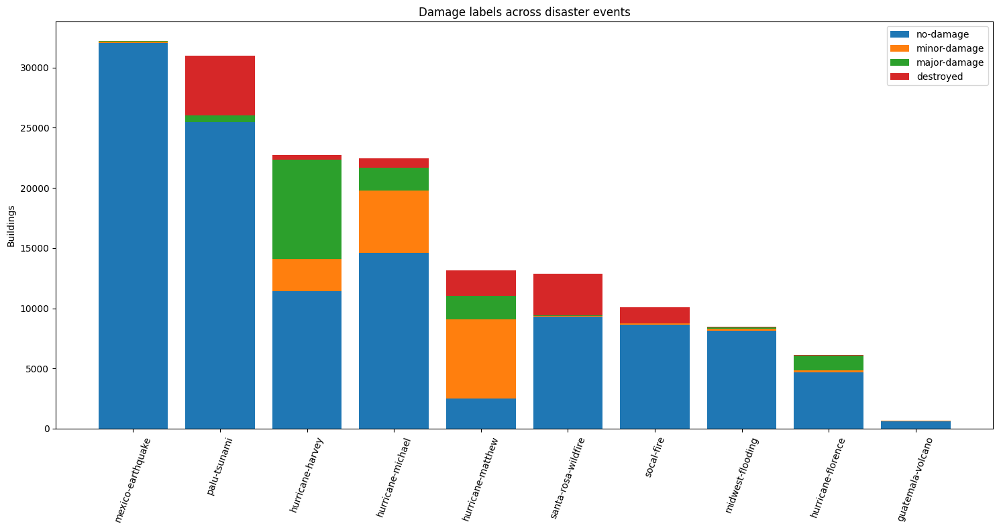

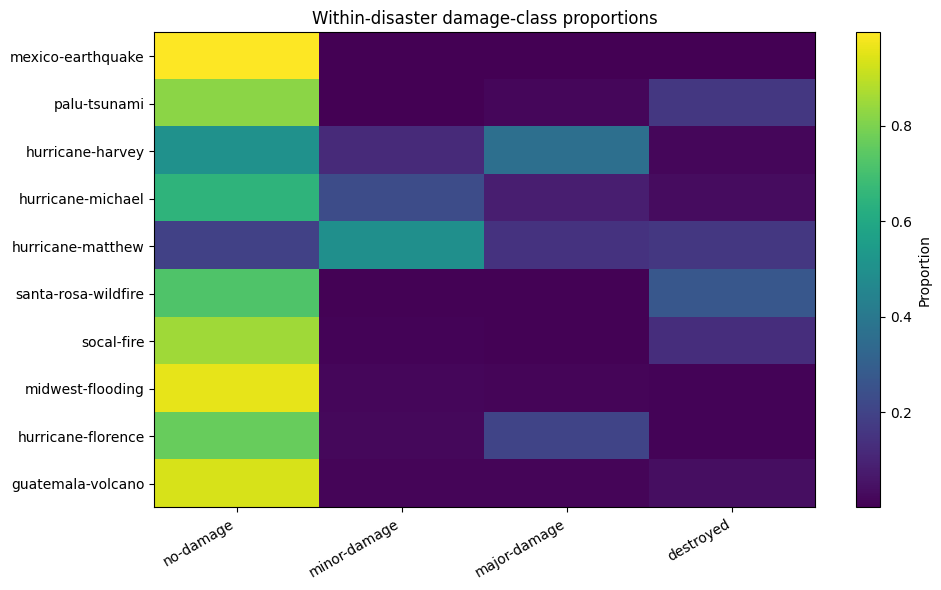

In [10]:
# ============================================================
# 9. EDA: stacked counts and proportion heatmap by disaster
# ============================================================
disaster_class = scene_df.groupby('disaster')[DAMAGE_CLASSES].sum()
disaster_class['total'] = disaster_class.sum(axis=1)
disaster_class = disaster_class.sort_values('total', ascending=False).drop(columns='total')

plot_df = disaster_class.head(min(18, len(disaster_class)))
fig, ax = plt.subplots(figsize=(15, 8))
bottom = np.zeros(len(plot_df))
for cls in DAMAGE_CLASSES:
    ax.bar(plot_df.index, plot_df[cls].values, bottom=bottom, label=cls)
    bottom += plot_df[cls].values
ax.set_title('Damage labels across disaster events')
ax.set_ylabel('Buildings')
ax.tick_params(axis='x', rotation=70)
ax.legend()
plt.tight_layout()
plt.savefig(FIG_DIR / 'eda_stacked_damage_by_disaster.png', dpi=160)
plt.show()

prop_df = disaster_class.div(disaster_class.sum(axis=1), axis=0).fillna(0)
fig, ax = plt.subplots(figsize=(10, max(6, 0.36 * len(prop_df))))
im = ax.imshow(prop_df.values, aspect='auto')
ax.set_xticks(range(len(DAMAGE_CLASSES)))
ax.set_xticklabels(DAMAGE_CLASSES, rotation=30, ha='right')
ax.set_yticks(range(len(prop_df)))
ax.set_yticklabels(prop_df.index)
ax.set_title('Within-disaster damage-class proportions')
plt.colorbar(im, ax=ax, label='Proportion')
plt.tight_layout()
plt.savefig(FIG_DIR / 'eda_disaster_class_heatmap.png', dpi=160)
plt.show()

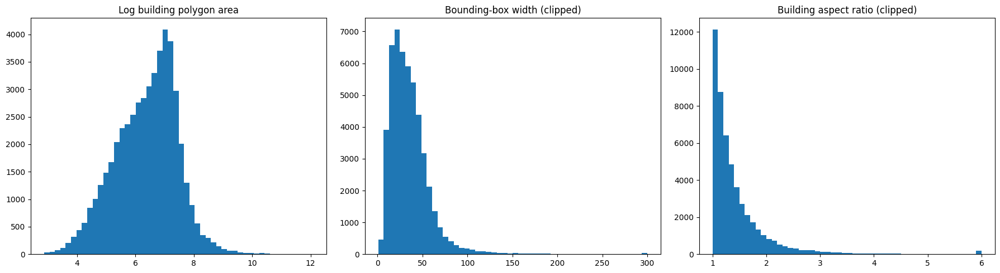

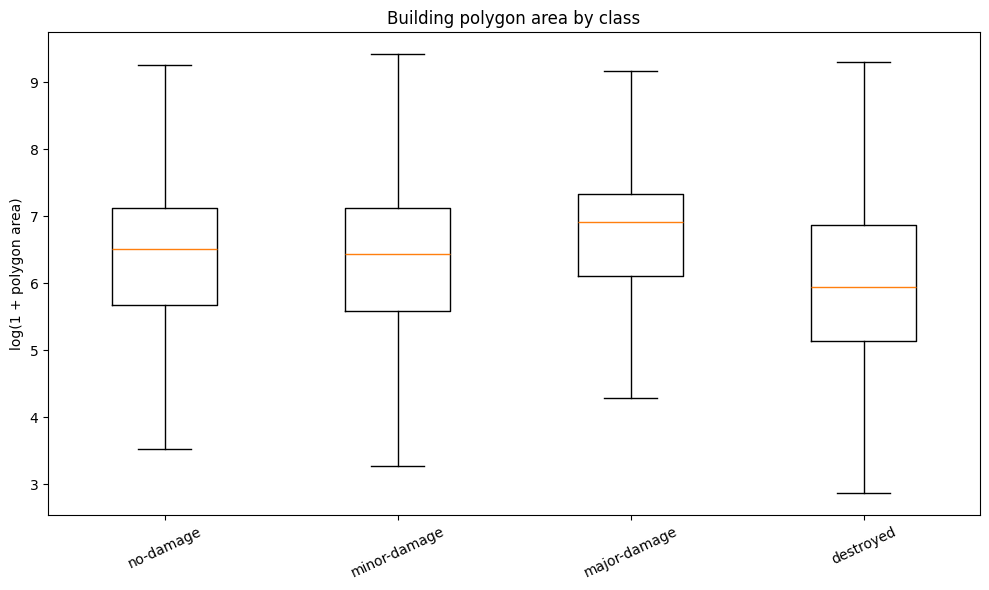

In [11]:
# ============================================================
# 10. EDA: polygon size and shape
# ============================================================
geometry_df = polygon_df.sample(min(50000, len(polygon_df)), random_state=SEED).copy()
geometry_df['log_area'] = np.log1p(geometry_df['polygon_area'])
geometry_df['aspect_ratio'] = (
    geometry_df[['bbox_width', 'bbox_height']].max(axis=1) /
    geometry_df[['bbox_width', 'bbox_height']].min(axis=1).clip(lower=1e-6)
)

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
axes[0].hist(geometry_df['log_area'], bins=50)
axes[0].set_title('Log building polygon area')
axes[1].hist(geometry_df['bbox_width'].clip(upper=300), bins=50)
axes[1].set_title('Bounding-box width (clipped)')
axes[2].hist(geometry_df['aspect_ratio'].clip(upper=6), bins=50)
axes[2].set_title('Building aspect ratio (clipped)')
plt.tight_layout()
plt.savefig(FIG_DIR / 'eda_polygon_geometry.png', dpi=160)
plt.show()

box_data = [geometry_df.loc[geometry_df.damage_label == c, 'log_area'] for c in DAMAGE_CLASSES]
plt.figure(figsize=(10, 6))
plt.boxplot(box_data, labels=DAMAGE_CLASSES, showfliers=False)
plt.title('Building polygon area by class')
plt.ylabel('log(1 + polygon area)')
plt.xticks(rotation=25)
plt.tight_layout()
plt.savefig(FIG_DIR / 'eda_polygon_area_by_class.png', dpi=160)
plt.show()

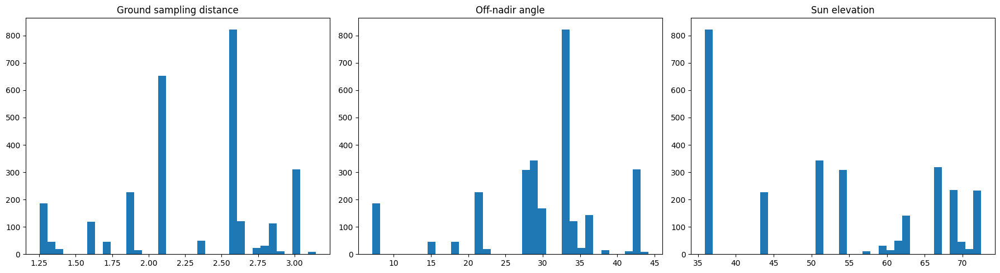

Image audit:   0%|          | 0/350 [00:00<?, ?it/s]

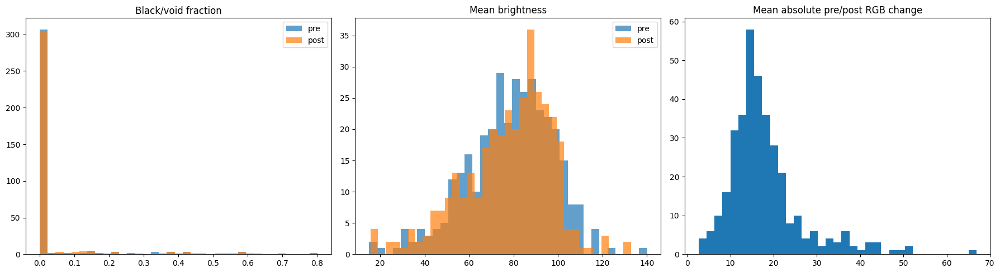

In [12]:
# ============================================================
# 11. EDA: satellite metadata and image quality
# ============================================================
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for ax, col, title in [
    (axes[0], 'gsd', 'Ground sampling distance'),
    (axes[1], 'off_nadir_angle', 'Off-nadir angle'),
    (axes[2], 'sun_elevation', 'Sun elevation')
]:
    ax.hist(scene_df[col].dropna(), bins=35)
    ax.set_title(title)
plt.tight_layout()
plt.savefig(FIG_DIR / 'eda_satellite_metadata.png', dpi=160)
plt.show()

quality_sample = scene_df.sample(min(350, len(scene_df)), random_state=SEED)
quality_rows = []
for row in tqdm(quality_sample.itertuples(index=False), total=len(quality_sample), desc='Image audit'):
    pre_b, pre_c = brightness_contrast(row.pre_image_path)
    post_b, post_c = brightness_contrast(row.post_image_path)
    pre = np.asarray(Image.open(row.pre_image_path).convert('RGB').resize((96,96)), dtype=np.float32)
    post = np.asarray(Image.open(row.post_image_path).convert('RGB').resize((96,96)), dtype=np.float32)
    quality_rows.append({
        'scene_id': row.scene_id, 'disaster': row.disaster,
        'pre_black_fraction': black_fraction(row.pre_image_path),
        'post_black_fraction': black_fraction(row.post_image_path),
        'pre_brightness': pre_b, 'post_brightness': post_b,
        'pre_contrast': pre_c, 'post_contrast': post_c,
        'mean_abs_rgb_change': float(np.abs(post-pre).mean())
    })
quality_df = pd.DataFrame(quality_rows)
quality_df.to_csv(TABLE_DIR / 'image_quality_audit.csv', index=False)

fig, axes = plt.subplots(1, 3, figsize=(18,5))
axes[0].hist(quality_df.pre_black_fraction, bins=35, alpha=.7, label='pre')
axes[0].hist(quality_df.post_black_fraction, bins=35, alpha=.7, label='post')
axes[0].set_title('Black/void fraction'); axes[0].legend()
axes[1].hist(quality_df.pre_brightness, bins=35, alpha=.7, label='pre')
axes[1].hist(quality_df.post_brightness, bins=35, alpha=.7, label='post')
axes[1].set_title('Mean brightness'); axes[1].legend()
axes[2].hist(quality_df.mean_abs_rgb_change, bins=35)
axes[2].set_title('Mean absolute pre/post RGB change')
plt.tight_layout()
plt.savefig(FIG_DIR / 'eda_image_quality.png', dpi=160)
plt.show()

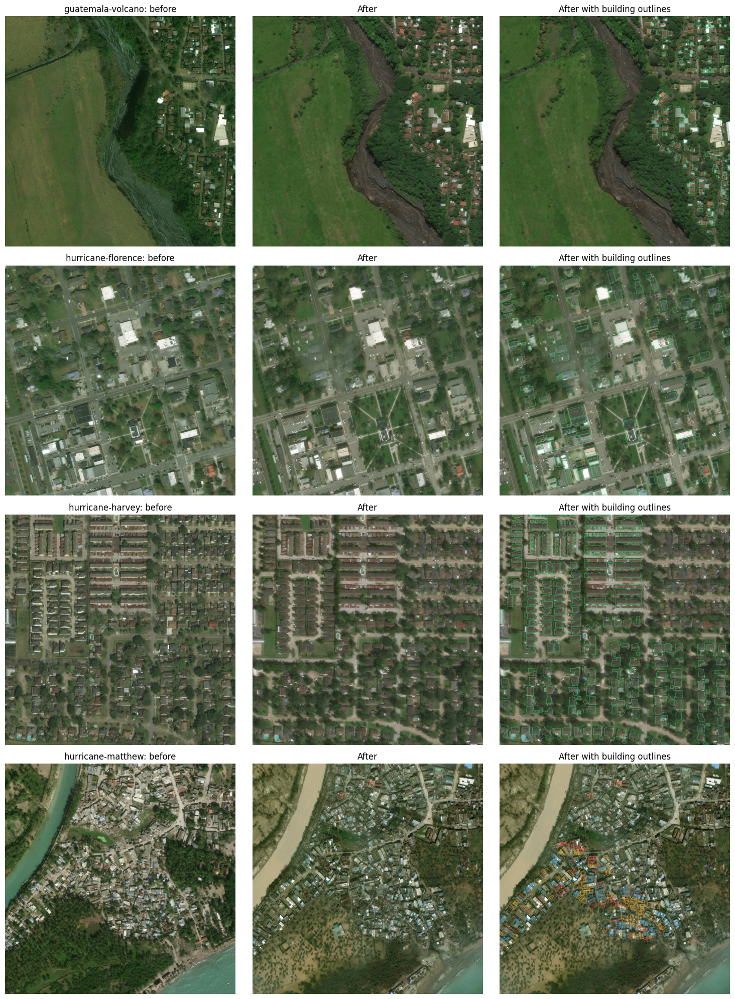

In [13]:
# ============================================================
# 12. EDA: annotated pre/post scene examples
# ============================================================
def annotated_post_image(image, json_path, maximum=250):
    canvas = image.copy()
    draw = ImageDraw.Draw(canvas, 'RGBA')
    data = read_json(json_path)
    count = 0
    for feat in data.get('features', {}).get('xy', []):
        poly = parse_polygon(feat)
        if poly is None:
            continue
        label = get_subtype(feat)
        draw.polygon(list(poly.exterior.coords), outline=DAMAGE_COLORS.get(label, (255,255,255,150)), width=3)
        count += 1
        if count >= maximum:
            break
    return canvas

sample_rows = []
for event in scene_df.disaster.drop_duplicates().head(4):
    part = scene_df[scene_df.disaster == event].sort_values('building_count', ascending=False)
    if len(part): sample_rows.append(part.iloc[0])

fig, axes = plt.subplots(len(sample_rows), 3, figsize=(15, 5*len(sample_rows)))
if len(sample_rows) == 1: axes = np.array([axes])
for i, row in enumerate(sample_rows):
    pre = Image.open(row.pre_image_path).convert('RGB')
    post = Image.open(row.post_image_path).convert('RGB')
    annotated = annotated_post_image(post, row.post_json_path)
    axes[i,0].imshow(pre); axes[i,0].set_title(f'{row.disaster}: before')
    axes[i,1].imshow(post); axes[i,1].set_title('After')
    axes[i,2].imshow(annotated); axes[i,2].set_title('After with building outlines')
    for ax in axes[i]: ax.axis('off')
plt.tight_layout()
plt.savefig(FIG_DIR / 'eda_annotated_scene_examples.png', dpi=160)
plt.show()

## C. Preprocessing into paired building samples

The same context box is cropped from the pre- and post-disaster images. Unclassified polygons are excluded. Per-event/per-class caps make the quick run diverse and prevent a single event from dominating.

In [14]:
# ============================================================
# 13. Select scenes across all available disaster events
# ============================================================
def balanced_scene_sample(df, maximum_per_disaster):
    parts = []
    for disaster, group in df.groupby('disaster'):
        group = group.sample(frac=1, random_state=SEED)
        if maximum_per_disaster is not None:
            group = group.head(maximum_per_disaster)
        parts.append(group)
    return pd.concat(parts, ignore_index=True).sample(frac=1, random_state=SEED).reset_index(drop=True)

selected_scene_df = balanced_scene_sample(scene_df, MAX_SCENES_PER_DISASTER)
print('Selected scenes:', len(selected_scene_df))
print('Selected disasters:', selected_scene_df.disaster.nunique())
display(selected_scene_df.disaster.value_counts().sort_index().to_frame('scenes'))

Selected scenes: 2799
Selected disasters: 10


,scenes
disaster,
guatemala-volcano,18
hurricane-florence,319
hurricane-harvey,319
hurricane-matthew,238
hurricane-michael,343
mexico-earthquake,121
midwest-flooding,279
palu-tsunami,113
santa-rosa-wildfire,226


In [15]:
# ============================================================
# 14. Extract paired building crops
# ============================================================
MANIFEST_PATH = PROJECT_DIR / 'building_crop_manifest.csv'

def context_bbox(poly, image_width, image_height, padding):
    minx, miny, maxx, maxy = poly.bounds
    side = max(maxx-minx, maxy-miny)
    pad = max(4.0, side*padding)
    cx, cy = (minx+maxx)/2, (miny+maxy)/2
    half = side/2 + pad
    return (
        max(0, int(math.floor(cx-half))), max(0, int(math.floor(cy-half))),
        min(image_width, int(math.ceil(cx+half))), min(image_height, int(math.ceil(cy+half)))
    )

def build_manifest(scene_table):
    pre_dir, post_dir = CROP_DIR/'pre', CROP_DIR/'post'
    pre_dir.mkdir(parents=True, exist_ok=True)
    post_dir.mkdir(parents=True, exist_ok=True)
    records, caps = [], Counter()

    for row in tqdm(scene_table.itertuples(index=False), total=len(scene_table), desc='Building crops'):
        data = read_json(row.post_json_path)
        pre_img = Image.open(row.pre_image_path).convert('RGB')
        post_img = Image.open(row.post_image_path).convert('RGB')
        if post_img.size != pre_img.size: post_img = post_img.resize(pre_img.size)
        width, height = pre_img.size
        features = list(data.get('features', {}).get('xy', []))
        random.Random(SEED + len(records)).shuffle(features)

        for local_idx, feat in enumerate(features):
            label = get_subtype(feat)
            if label not in DAMAGE_CLASSES: continue
            if caps[(row.disaster, label)] >= MAX_BUILDINGS_PER_CLASS_PER_DISASTER: continue
            poly = parse_polygon(feat)
            if poly is None: continue
            minx, miny, maxx, maxy = poly.bounds
            if maxx-minx < MIN_POLYGON_SIDE or maxy-miny < MIN_POLYGON_SIDE: continue
            left, top, right, bottom = context_bbox(poly, width, height, CONTEXT_PADDING)
            if right-left < MIN_CROP_SIDE or bottom-top < MIN_CROP_SIDE: continue

            crop_id = f'{row.scene_id}__b{local_idx:04d}'
            pre_path, post_path = pre_dir/f'{crop_id}.jpg', post_dir/f'{crop_id}.jpg'
            pre_img.crop((left,top,right,bottom)).save(pre_path, quality=94)
            post_img.crop((left,top,right,bottom)).save(post_path, quality=94)
            records.append({
                'crop_id': crop_id, 'scene_id': row.scene_id, 'disaster': row.disaster,
                'damage_label': label, 'label_id': LABEL_TO_ID[label],
                'pre_crop_path': str(pre_path), 'post_crop_path': str(post_path),
                'crop_width': right-left, 'crop_height': bottom-top,
                'polygon_area': float(poly.area)
            })
            caps[(row.disaster, label)] += 1
            if len(records) >= MAX_TOTAL_BUILDINGS:
                return pd.DataFrame(records)
    return pd.DataFrame(records)

if MANIFEST_PATH.exists() and not FORCE_REBUILD_CROPS:
    crop_df = pd.read_csv(MANIFEST_PATH)
    valid_manifest = len(crop_df) and Path(crop_df.iloc[0].pre_crop_path).exists()
    if not valid_manifest:
        crop_df = build_manifest(selected_scene_df)
        crop_df.to_csv(MANIFEST_PATH, index=False)
else:
    if FORCE_REBUILD_CROPS and CROP_DIR.exists():
        shutil.rmtree(CROP_DIR); CROP_DIR.mkdir(parents=True, exist_ok=True)
    crop_df = build_manifest(selected_scene_df)
    crop_df.to_csv(MANIFEST_PATH, index=False)

if crop_df.empty:
    raise RuntimeError('No building crops were generated.')
print('Crop manifest:', crop_df.shape)
print('Disasters:', crop_df.disaster.nunique())
display(crop_df.damage_label.value_counts().reindex(DAMAGE_CLASSES).fillna(0).astype(int))

Building crops:   0%|          | 0/2799 [00:00<?, ?it/s]

Crop manifest: (60000, 10)
Disasters: 10


damage_label
no-damage       38028
minor-damage     8013
major-damage     7735
destroyed        6224
Name: count, dtype: int64

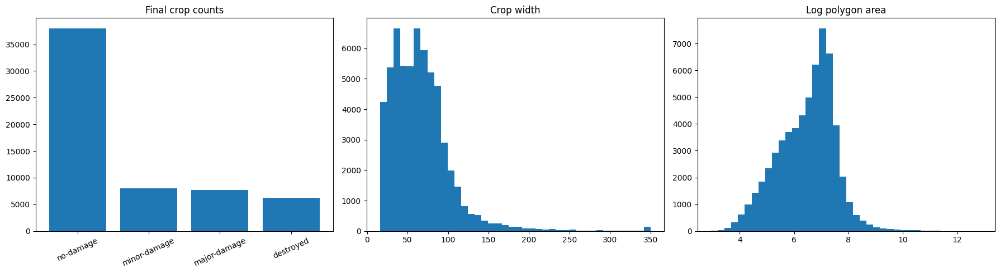

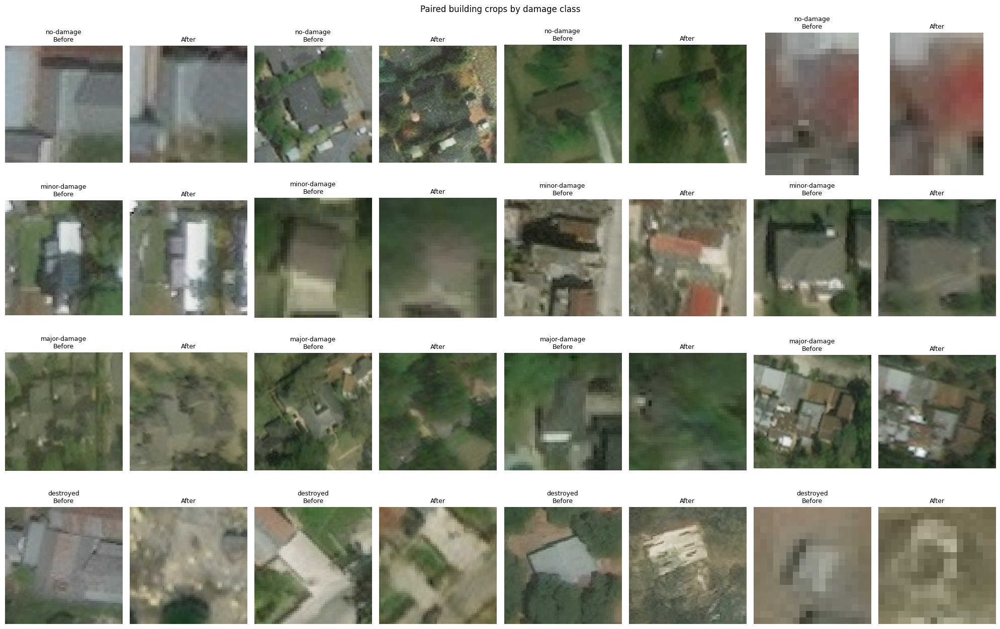

In [16]:
# ============================================================
# 15. Post-preprocessing EDA and crop gallery
# ============================================================
fig, axes = plt.subplots(1,3,figsize=(18,5))
counts = crop_df.damage_label.value_counts().reindex(DAMAGE_CLASSES).fillna(0)
axes[0].bar(counts.index, counts.values); axes[0].set_title('Final crop counts'); axes[0].tick_params(axis='x', rotation=25)
axes[1].hist(crop_df.crop_width.clip(upper=350), bins=40); axes[1].set_title('Crop width')
axes[2].hist(np.log1p(crop_df.polygon_area), bins=40); axes[2].set_title('Log polygon area')
plt.tight_layout(); plt.savefig(FIG_DIR/'eda_final_crop_manifest.png', dpi=160); plt.show()

fig, axes = plt.subplots(4, 8, figsize=(20,13))
for row_idx, cls in enumerate(DAMAGE_CLASSES):
    sample = crop_df[crop_df.damage_label==cls].sample(min(4, (crop_df.damage_label==cls).sum()), random_state=SEED)
    for j in range(4):
        a, b = axes[row_idx,2*j], axes[row_idx,2*j+1]
        if j < len(sample):
            r = sample.iloc[j]
            a.imshow(Image.open(r.pre_crop_path)); b.imshow(Image.open(r.post_crop_path))
            a.set_title(f'{cls}\nBefore', fontsize=9); b.set_title('After', fontsize=9)
        a.axis('off'); b.axis('off')
plt.suptitle('Paired building crops by damage class')
plt.tight_layout(); plt.savefig(FIG_DIR/'eda_building_crop_gallery.png', dpi=160); plt.show()

## D. Honest high-accuracy evaluation design

The earlier notebook obtained approximately 47% accuracy on a **balanced unseen-disaster holdout**. That does not mean the code failed: unseen-event building-damage generalisation is substantially harder than an in-domain split.

This version supports two protocols:

### `EXPERIMENT_MODE = "in_domain"` — default high-accuracy target

- the same disaster types may appear in training and testing;
- different satellite scenes are kept in different splits;
- class stratification is used where supported;
- this is appropriate for evaluating a Flask prototype on data drawn from the same operational domain.

### `EXPERIMENT_MODE = "cross_event"` — dissertation generalisation test

- one complete disaster is excluded from training;
- performance is expected to be substantially lower;
- this directly tests the UREC1 unseen-event research question.

Do not report the in-domain result as unseen-disaster performance.


In [17]:
# ============================================================
# 16. Dual evaluation protocol
# ============================================================
def split_distribution(frame, name):
    counts = (
        frame["damage_label"]
        .value_counts()
        .reindex(DAMAGE_CLASSES)
        .fillna(0)
        .astype(int)
    )
    return {
        "split": name,
        "samples": len(frame),
        "scenes": frame["scene_id"].nunique(),
        "disasters": frame["disaster"].nunique(),
        **{label: int(counts[label]) for label in DAMAGE_CLASSES},
    }

def stratified_group_split(frame):
    """
    Leakage-safe in-domain split. Stratifies labels while grouping by scene.
    Falls back to repeated GroupShuffleSplit when StratifiedGroupKFold is
    unavailable in the installed scikit-learn version.
    """
    frame = frame.sample(frac=1, random_state=SEED).reset_index(drop=True)

    if StratifiedGroupKFold is not None:
        outer = StratifiedGroupKFold(
            n_splits=5,
            shuffle=True,
            random_state=SEED
        )
        trainval_idx, test_idx = next(
            outer.split(
                frame,
                y=frame["label_id"],
                groups=frame["scene_id"]
            )
        )
        trainval = frame.iloc[trainval_idx].reset_index(drop=True)
        test = frame.iloc[test_idx].reset_index(drop=True)

        inner = StratifiedGroupKFold(
            n_splits=5,
            shuffle=True,
            random_state=SEED + 1
        )
        train_idx, val_idx = next(
            inner.split(
                trainval,
                y=trainval["label_id"],
                groups=trainval["scene_id"]
            )
        )
        train = trainval.iloc[train_idx].reset_index(drop=True)
        val = trainval.iloc[val_idx].reset_index(drop=True)
        return train, val, test

    print("StratifiedGroupKFold unavailable; using grouped fallback.")
    outer = GroupShuffleSplit(
        n_splits=1,
        test_size=0.20,
        random_state=SEED
    )
    trainval_idx, test_idx = next(
        outer.split(frame, groups=frame["scene_id"])
    )
    trainval = frame.iloc[trainval_idx].reset_index(drop=True)
    test = frame.iloc[test_idx].reset_index(drop=True)

    inner = GroupShuffleSplit(
        n_splits=1,
        test_size=0.20,
        random_state=SEED + 1
    )
    train_idx, val_idx = next(
        inner.split(trainval, groups=trainval["scene_id"])
    )
    return (
        trainval.iloc[train_idx].reset_index(drop=True),
        trainval.iloc[val_idx].reset_index(drop=True),
        test,
    )

def choose_cross_event(frame, min_each_class=30):
    rows = []
    for disaster, group in frame.groupby("disaster"):
        counts = (
            group["damage_label"]
            .value_counts()
            .reindex(DAMAGE_CLASSES)
            .fillna(0)
            .astype(int)
        )
        remaining = frame[frame["disaster"] != disaster]
        remaining_counts = (
            remaining["damage_label"]
            .value_counts()
            .reindex(DAMAGE_CLASSES)
            .fillna(0)
            .astype(int)
        )
        rows.append({
            "disaster": disaster,
            "samples": len(group),
            "minimum_class_support": int(counts.min()),
            "remaining_samples": len(remaining),
            "remaining_minimum_class_support": int(remaining_counts.min()),
            **{f"test_{label}": int(counts[label]) for label in DAMAGE_CLASSES},
        })

    candidates = pd.DataFrame(rows).sort_values(
        ["minimum_class_support", "samples"],
        ascending=False
    )
    display(candidates)

    valid = candidates[
        (candidates["minimum_class_support"] >= min_each_class)
        & (candidates["remaining_minimum_class_support"] >= 10)
        & (candidates["samples"] <= 0.40 * len(frame))
    ]
    if valid.empty:
        return None
    return valid.iloc[0]["disaster"]

def cross_event_split(frame):
    holdout = choose_cross_event(frame)
    if holdout is None:
        raise RuntimeError(
            "No event has sufficient support in all four classes. "
            "Use EXPERIMENT_MODE='in_domain' or increase the crop limits."
        )

    test = frame[frame["disaster"] == holdout].copy()
    remaining = frame[frame["disaster"] != holdout].copy()

    # Validation remains scene-grouped.
    if StratifiedGroupKFold is not None:
        splitter = StratifiedGroupKFold(
            n_splits=5,
            shuffle=True,
            random_state=SEED
        )
        train_idx, val_idx = next(
            splitter.split(
                remaining,
                y=remaining["label_id"],
                groups=remaining["scene_id"]
            )
        )
        train = remaining.iloc[train_idx].copy()
        val = remaining.iloc[val_idx].copy()
    else:
        splitter = GroupShuffleSplit(
            n_splits=1,
            test_size=0.20,
            random_state=SEED
        )
        train_idx, val_idx = next(
            splitter.split(remaining, groups=remaining["scene_id"])
        )
        train = remaining.iloc[train_idx].copy()
        val = remaining.iloc[val_idx].copy()

    return (
        train.reset_index(drop=True),
        val.reset_index(drop=True),
        test.reset_index(drop=True),
        holdout,
    )

if EXPERIMENT_MODE == "in_domain":
    train_df, val_df, test_df = stratified_group_split(crop_df)
    split_used = "stratified_scene_grouped_in_domain"
    heldout_disaster = None
    split_reason = (
        "Same disaster domain may occur across splits, but scene IDs are "
        "strictly separated. This protocol targets deployment accuracy."
    )
else:
    train_df, val_df, test_df, heldout_disaster = cross_event_split(crop_df)
    split_used = "complete_disaster_holdout"
    split_reason = (
        "A complete disaster is absent from training and used only for testing."
    )

summary = pd.DataFrame([
    split_distribution(train_df, "train"),
    split_distribution(val_df, "validation"),
    split_distribution(test_df, "test"),
])

display(summary)
print("Split used:", split_used)
print("Held-out disaster:", heldout_disaster)
print("Interpretation:", split_reason)

# Strict leakage audits.
assert set(train_df["crop_id"]).isdisjoint(val_df["crop_id"])
assert set(train_df["crop_id"]).isdisjoint(test_df["crop_id"])
assert set(val_df["crop_id"]).isdisjoint(test_df["crop_id"])
assert set(train_df["scene_id"]).isdisjoint(val_df["scene_id"])
assert set(train_df["scene_id"]).isdisjoint(test_df["scene_id"])
assert set(val_df["scene_id"]).isdisjoint(test_df["scene_id"])

summary.to_csv(TABLE_DIR / "split_summary.csv", index=False)
train_df.to_csv(TABLE_DIR / "train_manifest.csv", index=False)
val_df.to_csv(TABLE_DIR / "validation_manifest.csv", index=False)
test_df.to_csv(TABLE_DIR / "test_manifest.csv", index=False)

print("Leakage audit passed.")


,split,samples,scenes,disasters,no-damage,minor-damage,major-damage,destroyed
0,train,39892,712,10,24625,5765,5102,4400
1,validation,9477,174,10,6347,1312,1039,779
2,test,10631,222,10,7056,936,1594,1045


Split used: stratified_scene_grouped_in_domain
Held-out disaster: None
Interpretation: Same disaster domain may occur across splits, but scene IDs are strictly separated. This protocol targets deployment accuracy.
Leakage audit passed.


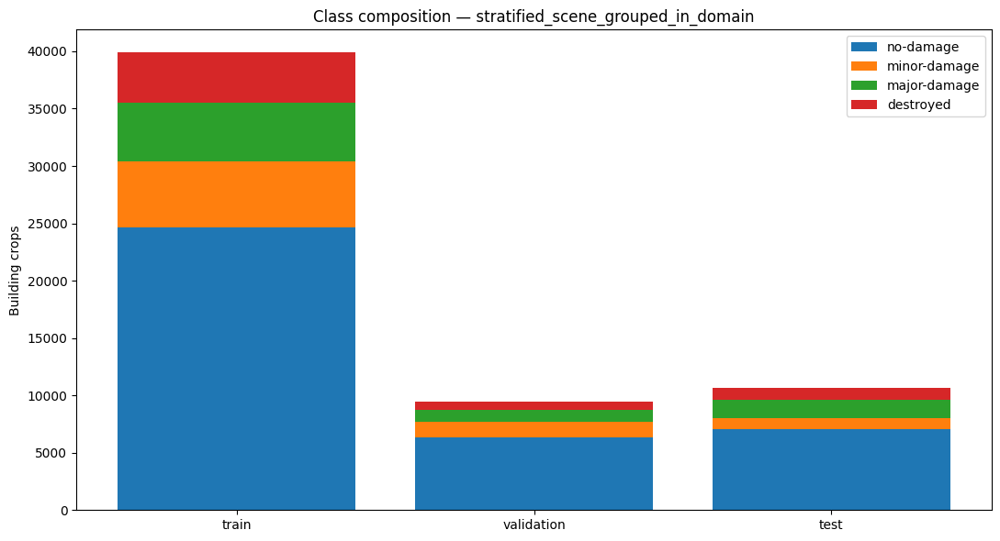

Majority-class baseline accuracy: 0.6637
Majority-class baseline balanced accuracy: 0.25


In [18]:
# ============================================================
# 17. Split charts and majority baseline
# ============================================================
split_plot = summary.set_index("split")[DAMAGE_CLASSES]

fig, ax = plt.subplots(figsize=(11, 6))
bottom = np.zeros(len(split_plot))
for label in DAMAGE_CLASSES:
    ax.bar(
        split_plot.index,
        split_plot[label].values,
        bottom=bottom,
        label=label
    )
    bottom += split_plot[label].values

ax.set_title(f"Class composition — {split_used}")
ax.set_ylabel("Building crops")
ax.legend()
plt.tight_layout()
plt.savefig(FIG_DIR / "split_composition.png", dpi=170)
plt.show()

majority_class = int(train_df["label_id"].mode().iloc[0])
majority_predictions = np.full(len(test_df), majority_class)
majority_accuracy = accuracy_score(
    test_df["label_id"].values,
    majority_predictions
)
majority_balanced = balanced_accuracy_score(
    test_df["label_id"].values,
    majority_predictions
)

print("Majority-class baseline accuracy:", round(majority_accuracy, 4))
print("Majority-class baseline balanced accuracy:", round(majority_balanced, 4))


## E. High-detail paired preprocessing and regularisation

The same augmentation is applied to the pre- and post-disaster images. MixUp also uses the same permutation and mixing coefficient for both inputs so temporal correspondence is preserved.


In [19]:
# ============================================================
# 18. Dataset and stable loaders
# ============================================================
IMAGENET_MEAN = np.array([0.485, 0.456, 0.406], dtype=np.float32)
IMAGENET_STD = np.array([0.229, 0.224, 0.225], dtype=np.float32)

def random_resized_pair(pre, post):
    width, height = pre.size
    scale = random.uniform(0.88, 1.0)
    crop_width = max(8, int(width * scale))
    crop_height = max(8, int(height * scale))
    left = random.randint(0, max(width - crop_width, 0))
    top = random.randint(0, max(height - crop_height, 0))
    box = (left, top, left + crop_width, top + crop_height)
    return pre.crop(box), post.crop(box)

def augment_pair(pre, post):
    if random.random() < 0.60:
        pre, post = random_resized_pair(pre, post)

    if random.random() < 0.50:
        pre = pre.transpose(Image.Transpose.FLIP_LEFT_RIGHT)
        post = post.transpose(Image.Transpose.FLIP_LEFT_RIGHT)

    if random.random() < 0.20:
        pre = pre.transpose(Image.Transpose.FLIP_TOP_BOTTOM)
        post = post.transpose(Image.Transpose.FLIP_TOP_BOTTOM)

    angle = random.choice([0, 90, 180, 270])
    if angle:
        pre = pre.rotate(angle)
        post = post.rotate(angle)

    # Shared photometric augmentation preserves relative change.
    brightness = random.uniform(0.88, 1.12)
    contrast = random.uniform(0.88, 1.12)
    saturation = random.uniform(0.92, 1.08)

    pre = ImageEnhance.Brightness(pre).enhance(brightness)
    post = ImageEnhance.Brightness(post).enhance(brightness)
    pre = ImageEnhance.Contrast(pre).enhance(contrast)
    post = ImageEnhance.Contrast(post).enhance(contrast)
    pre = ImageEnhance.Color(pre).enhance(saturation)
    post = ImageEnhance.Color(post).enhance(saturation)

    return pre, post

def to_tensor(image):
    array = np.asarray(
        image.resize((IMG_SIZE, IMG_SIZE)),
        dtype=np.float32
    ) / 255.0
    array = (array - IMAGENET_MEAN) / IMAGENET_STD
    return torch.from_numpy(array.transpose(2, 0, 1)).float()

class BuildingPairDataset(Dataset):
    def __init__(self, frame, augment=False):
        self.frame = frame.reset_index(drop=True)
        self.augment = augment

    def __len__(self):
        return len(self.frame)

    def __getitem__(self, index):
        row = self.frame.iloc[index]
        pre = Image.open(row["pre_crop_path"]).convert("RGB")
        post = Image.open(row["post_crop_path"]).convert("RGB")

        if self.augment:
            pre, post = augment_pair(pre, post)

        return {
            "pre": to_tensor(pre),
            "post": to_tensor(post),
            "label": torch.tensor(int(row["label_id"]), dtype=torch.long),
            "crop_id": row["crop_id"],
            "scene_id": row["scene_id"],
            "disaster": row["disaster"],
        }

train_dataset = BuildingPairDataset(train_df, augment=True)
val_dataset = BuildingPairDataset(val_df, augment=False)
test_dataset = BuildingPairDataset(test_df, augment=False)

# Moderate square-root class weights. This is deliberately less aggressive
# than full inverse-frequency weighting.
counts = (
    train_df["label_id"]
    .value_counts()
    .reindex(range(4))
    .fillna(0)
    .astype(float)
)
raw_weights = (
    counts.sum() / np.maximum(4.0 * counts.values, 1.0)
) ** 0.25
raw_weights = raw_weights / max(raw_weights.mean(), 1e-8)
class_weights = np.clip(
    raw_weights,
    0.75,
    1.80
).astype(np.float32)
class_weight_tensor = torch.tensor(
    class_weights,
    dtype=torch.float32,
    device=DEVICE
)

for class_id, label in enumerate(DAMAGE_CLASSES):
    print(
        f"{label:15s} count={int(counts.iloc[class_id]):6d} "
        f"loss_weight={class_weights[class_id]:.3f}"
    )

loader_args = dict(
    batch_size=BATCH_SIZE,
    num_workers=0,
    pin_memory=False,
    drop_last=False,
)

train_loader = DataLoader(
    train_dataset,
    shuffle=True,
    **loader_args
)
val_loader = DataLoader(
    val_dataset,
    shuffle=False,
    **loader_args
)
test_loader = DataLoader(
    test_dataset,
    shuffle=False,
    **loader_args
)

batch = next(iter(train_loader))
print("Pre:", batch["pre"].shape)
print("Post:", batch["post"].shape)
print("Labels:", batch["label"].shape)


no-damage       count= 24625 loss_weight=0.750
minor-damage    count=  5765 loss_weight=1.054
major-damage    count=  5102 loss_weight=1.086
destroyed       count=  4400 loss_weight=1.127
Pre: torch.Size([12, 3, 256, 256])
Post: torch.Size([12, 3, 256, 256])
Labels: torch.Size([12])


## F. Strong ConvNeXt comparison models

Three pretrained ConvNeXt-Tiny models are compared:

1. **Post-only baseline** — uses only the post-disaster building crop.
2. **Nine-channel change-stack model** — concatenates pre RGB, post RGB and absolute RGB difference.
3. **Siamese change-aware model** — uses a shared encoder and combines pre features, post features, signed change, gated absolute change and feature interaction.

The backbone is trained in three stages: frozen-head training, partial fine-tuning and low-learning-rate full fine-tuning.


In [20]:
# ============================================================
# 19. ConvNeXt-Tiny model definitions — corrected feature output
# ============================================================
def convnext_tiny_backbone(pretrained=True):
    """
    Create a ConvNeXt-Tiny feature extractor that returns [batch, 768].

    Torchvision ConvNeXt uses:
        features -> avgpool -> classifier
    where classifier contains:
        LayerNorm -> Flatten -> Linear

    Replacing the entire classifier with Identity removes Flatten and causes
    a [batch, 768, 1, 1] tensor. Therefore, only the final Linear layer is
    replaced with Identity, while LayerNorm and Flatten are retained.
    """
    model = None

    if pretrained:
        try:
            model = models.convnext_tiny(
                weights=models.ConvNeXt_Tiny_Weights.DEFAULT
            )
            print("Loaded ConvNeXt-Tiny pretrained weights.")
        except Exception as first_error:
            try:
                model = models.convnext_tiny(pretrained=True)
                print("Loaded legacy pretrained ConvNeXt-Tiny weights.")
            except Exception as second_error:
                print(
                    "Pretrained ConvNeXt weights were unavailable. "
                    "Enable Kaggle Internet for maximum accuracy."
                )
                print(first_error)
                print(second_error)

    if model is None:
        try:
            model = models.convnext_tiny(weights=None)
        except TypeError:
            model = models.convnext_tiny(pretrained=False)

    feature_dimension = model.classifier[-1].in_features

    # Keep ConvNeXt's LayerNorm and Flatten; remove only the ImageNet head.
    model.classifier[-1] = nn.Identity()

    return model, feature_dimension


def adapt_first_conv(model, input_channels):
    """
    Adapt ConvNeXt's first convolution to accept more than three channels.

    Pretrained RGB weights are repeated and scaled so the initial activation
    magnitude remains similar to the original three-channel model.
    """
    old_conv = model.features[0][0]

    new_conv = nn.Conv2d(
        input_channels,
        old_conv.out_channels,
        kernel_size=old_conv.kernel_size,
        stride=old_conv.stride,
        padding=old_conv.padding,
        dilation=old_conv.dilation,
        groups=old_conv.groups,
        bias=old_conv.bias is not None,
    )

    with torch.no_grad():
        repeats = int(math.ceil(input_channels / 3))

        repeated_weights = (
            old_conv.weight
            .repeat(1, repeats, 1, 1)
            [:, :input_channels]
        )

        repeated_weights *= 3.0 / float(input_channels)
        new_conv.weight.copy_(repeated_weights)

        if old_conv.bias is not None:
            new_conv.bias.copy_(old_conv.bias)

    model.features[0][0] = new_conv
    return model


def ensure_feature_vector(features):
    """
    Compatibility guard for torchvision versions that may return spatial
    feature maps. Converts [B, C, 1, 1] or [B, C, H, W] into [B, C].
    """
    if features.ndim == 4:
        features = F.adaptive_avg_pool2d(
            features,
            output_size=1
        )
        features = torch.flatten(features, 1)

    return features


class PostOnlyConvNeXt(nn.Module):
    def __init__(self, pretrained=True):
        super().__init__()

        self.backbone, dimension = convnext_tiny_backbone(
            pretrained
        )

        self.classifier = nn.Sequential(
            nn.LayerNorm(dimension),
            nn.Dropout(0.35),
            nn.Linear(dimension, 512),
            nn.GELU(),
            nn.Dropout(0.25),
            nn.Linear(512, 4),
        )

    def forward(self, pre, post):
        features = ensure_feature_vector(
            self.backbone(post)
        )
        return self.classifier(features)


class ChangeStackConvNeXt(nn.Module):
    """
    Nine-channel input:
      pre-disaster RGB +
      post-disaster RGB +
      absolute RGB difference.
    """
    def __init__(self, pretrained=True):
        super().__init__()

        self.backbone, dimension = convnext_tiny_backbone(
            pretrained
        )

        self.backbone = adapt_first_conv(
            self.backbone,
            input_channels=9,
        )

        self.classifier = nn.Sequential(
            nn.LayerNorm(dimension),
            nn.Dropout(0.35),
            nn.Linear(dimension, 512),
            nn.GELU(),
            nn.Dropout(0.25),
            nn.Linear(512, 4),
        )

    def forward(self, pre, post):
        absolute_difference = torch.abs(
            post - pre
        )

        stacked = torch.cat(
            [
                pre,
                post,
                absolute_difference,
            ],
            dim=1,
        )

        features = ensure_feature_vector(
            self.backbone(stacked)
        )

        return self.classifier(features)


class SiameseChangeConvNeXt(nn.Module):
    def __init__(self, pretrained=True):
        super().__init__()

        self.shared_backbone, dimension = (
            convnext_tiny_backbone(pretrained)
        )

        self.gate = nn.Sequential(
            nn.Linear(
                dimension * 2,
                dimension,
            ),
            nn.Sigmoid(),
        )

        self.classifier = nn.Sequential(
            nn.LayerNorm(dimension * 5),
            nn.Dropout(0.40),
            nn.Linear(
                dimension * 5,
                1536,
            ),
            nn.GELU(),
            nn.Dropout(0.30),
            nn.Linear(1536, 512),
            nn.GELU(),
            nn.Dropout(0.20),
            nn.Linear(512, 4),
        )

    def forward(self, pre, post):
        pre_features = ensure_feature_vector(
            self.shared_backbone(pre)
        )
        post_features = ensure_feature_vector(
            self.shared_backbone(post)
        )

        signed_change = (
            post_features - pre_features
        )
        absolute_change = torch.abs(
            signed_change
        )
        interaction = (
            pre_features * post_features
        )

        gate = self.gate(
            torch.cat(
                [
                    pre_features,
                    post_features,
                ],
                dim=1,
            )
        )

        gated_change = gate * absolute_change

        fused = torch.cat(
            [
                pre_features,
                post_features,
                signed_change,
                gated_change,
                interaction,
            ],
            dim=1,
        )

        return self.classifier(fused)


def create_model(name, pretrained=True):
    if name == "post_only_convnext_tiny":
        return PostOnlyConvNeXt(pretrained)

    if name == "change_stack_convnext_tiny":
        return ChangeStackConvNeXt(pretrained)

    if name == "siamese_change_convnext_tiny":
        return SiameseChangeConvNeXt(pretrained)

    raise ValueError(
        f"Unknown model name: {name}"
    )


MODEL_NAMES = [
    "post_only_convnext_tiny",
    "change_stack_convnext_tiny",
    "siamese_change_convnext_tiny",
]


# Architecture sanity check.
for model_name in MODEL_NAMES:
    model = create_model(
        model_name,
        USE_PRETRAINED
    ).to(DEVICE).eval()

    with torch.no_grad():
        output = model(
            torch.zeros(
                2,
                3,
                IMG_SIZE,
                IMG_SIZE,
                device=DEVICE,
            ),
            torch.zeros(
                2,
                3,
                IMG_SIZE,
                IMG_SIZE,
                device=DEVICE,
            ),
        )

    assert output.shape == (
        2,
        len(DAMAGE_CLASSES),
    ), (
        f"{model_name} returned {tuple(output.shape)}; "
        f"expected (2, {len(DAMAGE_CLASSES)})."
    )

    print(
        model_name,
        "->",
        tuple(output.shape),
    )

    del model
    gc.collect()

    if DEVICE.type == "cuda":
        torch.cuda.empty_cache()


Downloading: "https://download.pytorch.org/models/convnext_tiny-983f1562.pth" to /root/.cache/torch/hub/checkpoints/convnext_tiny-983f1562.pth


100%|██████████| 109M/109M [00:00<00:00, 237MB/s] 


Loaded ConvNeXt-Tiny pretrained weights.
post_only_convnext_tiny -> (2, 4)
Loaded ConvNeXt-Tiny pretrained weights.
change_stack_convnext_tiny -> (2, 4)
Loaded ConvNeXt-Tiny pretrained weights.
siamese_change_convnext_tiny -> (2, 4)


In [21]:
# ============================================================
# 20. Freeze/unfreeze controls and optimiser groups
# ============================================================
def backbone_modules(model):
    if hasattr(model, "shared_backbone"):
        return [model.shared_backbone]
    return [model.backbone]

def set_training_stage(model, stage):
    """
    stage = "head"    : freeze all backbone parameters
    stage = "partial" : unfreeze the final EfficientNet feature blocks
    stage = "full"    : unfreeze the complete model
    """
    for parameter in model.parameters():
        parameter.requires_grad = True

    if stage == "head":
        for backbone in backbone_modules(model):
            for parameter in backbone.parameters():
                parameter.requires_grad = False

    elif stage == "partial":
        for backbone in backbone_modules(model):
            for parameter in backbone.parameters():
                parameter.requires_grad = False
            # EfficientNet final three feature groups and final conv.
            for block in list(backbone.features.children())[-4:]:
                for parameter in block.parameters():
                    parameter.requires_grad = True

    elif stage == "full":
        pass
    else:
        raise ValueError(stage)

    trainable = sum(
        parameter.numel()
        for parameter in model.parameters()
        if parameter.requires_grad
    )
    total = sum(parameter.numel() for parameter in model.parameters())
    print(
        f"Training stage={stage}: "
        f"{trainable:,}/{total:,} parameters trainable"
    )

def build_optimizer(model, stage):
    if stage == "head":
        return torch.optim.AdamW(
            filter(lambda p: p.requires_grad, model.parameters()),
            lr=HEAD_LEARNING_RATE,
            weight_decay=WEIGHT_DECAY,
        )

    if stage == "partial":
        backbone_ids = {
            id(parameter)
            for backbone in backbone_modules(model)
            for parameter in backbone.parameters()
            if parameter.requires_grad
        }
        backbone_parameters = [
            parameter
            for parameter in model.parameters()
            if id(parameter) in backbone_ids and parameter.requires_grad
        ]
        head_parameters = [
            parameter
            for parameter in model.parameters()
            if id(parameter) not in backbone_ids and parameter.requires_grad
        ]
        return torch.optim.AdamW(
            [
                {
                    "params": backbone_parameters,
                    "lr": BACKBONE_LEARNING_RATE,
                },
                {
                    "params": head_parameters,
                    "lr": HEAD_LEARNING_RATE * 0.25,
                },
            ],
            weight_decay=WEIGHT_DECAY,
        )

    return torch.optim.AdamW(
        model.parameters(),
        lr=FULL_LEARNING_RATE,
        weight_decay=WEIGHT_DECAY,
    )


## G. Training, TTA, calibration and ensemble

The notebook selects checkpoints using a composite validation score:

\[
0.50 \times \text{macro-F1} +
0.30 \times \text{balanced accuracy} +
0.20 \times \text{accuracy}
\]

This prevents an apparently high accuracy from being achieved by ignoring minor or major damage.


In [22]:
# ============================================================
# 21. Metrics, loss, AMP and MixUp
# ============================================================
ALL_LABELS = list(range(4))

def report_compat(y_true, y_pred, output_dict=False):
    kwargs = dict(
        y_true=y_true,
        y_pred=y_pred,
        labels=ALL_LABELS,
        target_names=DAMAGE_CLASSES,
        output_dict=output_dict,
    )
    try:
        return classification_report(**kwargs, zero_division=0)
    except TypeError:
        return classification_report(**kwargs)

def f1_compat(y_true, y_pred, average="macro"):
    try:
        return f1_score(
            y_true,
            y_pred,
            labels=ALL_LABELS,
            average=average,
            zero_division=0,
        )
    except TypeError:
        return f1_score(
            y_true,
            y_pred,
            labels=ALL_LABELS,
            average=average,
        )

try:
    loss_function = nn.CrossEntropyLoss(
        weight=class_weight_tensor,
        label_smoothing=0.05,
    )
except TypeError:
    loss_function = nn.CrossEntropyLoss(weight=class_weight_tensor)

def amp_context():
    if DEVICE.type == "cuda":
        try:
            return torch.autocast(
                device_type="cuda",
                dtype=torch.float16
            )
        except Exception:
            return torch.cuda.amp.autocast()
    return nullcontext()

def make_scaler():
    if DEVICE.type != "cuda":
        return None
    try:
        return torch.amp.GradScaler("cuda")
    except Exception:
        return torch.cuda.amp.GradScaler()

def mixup_batch(pre, post, labels):
    if random.random() > MIXUP_PROBABILITY:
        return pre, post, labels, labels, 1.0

    lam = np.random.beta(MIXUP_ALPHA, MIXUP_ALPHA)
    permutation = torch.randperm(pre.size(0), device=pre.device)
    mixed_pre = lam * pre + (1.0 - lam) * pre[permutation]
    mixed_post = lam * post + (1.0 - lam) * post[permutation]
    return mixed_pre, mixed_post, labels, labels[permutation], float(lam)

def composite_score(y_true, y_pred):
    accuracy = accuracy_score(y_true, y_pred)
    balanced = balanced_accuracy_score(y_true, y_pred)
    macro_f1 = f1_compat(y_true, y_pred, "macro")
    return (
        0.50 * macro_f1
        + 0.30 * balanced
        + 0.20 * accuracy
    )


In [23]:
# ============================================================
# 22. Epoch and prediction functions
# ============================================================
def run_epoch(model, loader, optimizer=None, scaler=None):
    training = optimizer is not None
    model.train(training)

    running_loss = 0.0
    truth = []
    predictions = []

    for batch in tqdm(
        loader,
        leave=False,
        desc="train" if training else "validate"
    ):
        pre = batch["pre"].to(DEVICE)
        post = batch["post"].to(DEVICE)
        labels = batch["label"].to(DEVICE)

        if training:
            optimizer.zero_grad(set_to_none=True)
            pre, post, target_a, target_b, lam = mixup_batch(
                pre, post, labels
            )
        else:
            target_a = target_b = labels
            lam = 1.0

        with amp_context():
            logits = model(pre, post)
            loss = (
                lam * loss_function(logits, target_a)
                + (1.0 - lam) * loss_function(logits, target_b)
            )

        if training:
            if scaler is not None:
                scaler.scale(loss).backward()
                scaler.unscale_(optimizer)
                torch.nn.utils.clip_grad_norm_(
                    model.parameters(), 2.0
                )
                scaler.step(optimizer)
                scaler.update()
            else:
                loss.backward()
                torch.nn.utils.clip_grad_norm_(
                    model.parameters(), 2.0
                )
                optimizer.step()

        running_loss += loss.item() * labels.size(0)

        # Use the original labels for understandable epoch monitoring.
        predictions.extend(logits.argmax(dim=1).detach().cpu().tolist())
        truth.extend(labels.detach().cpu().tolist())

    return {
        "loss": running_loss / max(len(loader.dataset), 1),
        "accuracy": accuracy_score(truth, predictions),
        "balanced_accuracy": balanced_accuracy_score(
            truth, predictions
        ),
        "macro_f1": f1_compat(truth, predictions, "macro"),
        "composite": composite_score(truth, predictions),
    }

@torch.no_grad()
def predict_probabilities(model, loader, tta=False):
    model.eval()
    all_probabilities = []
    all_labels = []
    crop_ids = []
    disasters = []

    for batch in tqdm(loader, leave=False, desc="predict"):
        pre = batch["pre"].to(DEVICE)
        post = batch["post"].to(DEVICE)

        transformations = [(pre, post)]

        if tta:
            transformations.extend([
                (
                    torch.flip(pre, dims=[3]),
                    torch.flip(post, dims=[3])
                ),
                (
                    torch.flip(pre, dims=[2]),
                    torch.flip(post, dims=[2])
                ),
                (
                    torch.flip(pre, dims=[2, 3]),
                    torch.flip(post, dims=[2, 3])
                ),
            ])

        probabilities = []
        for transformed_pre, transformed_post in transformations:
            logits = model(transformed_pre, transformed_post)
            probabilities.append(torch.softmax(logits, dim=1))

        mean_probabilities = torch.stack(
            probabilities,
            dim=0
        ).mean(dim=0)

        all_probabilities.append(
            mean_probabilities.cpu().numpy()
        )
        all_labels.extend(batch["label"].numpy().tolist())
        crop_ids.extend(list(batch["crop_id"]))
        disasters.extend(list(batch["disaster"]))

    return (
        np.asarray(all_labels, dtype=int),
        np.concatenate(all_probabilities, axis=0),
        crop_ids,
        disasters,
    )

def probability_table(y_true, probabilities, crop_ids, disasters):
    y_pred = probabilities.argmax(axis=1)
    table = pd.DataFrame({
        "crop_id": crop_ids,
        "disaster": disasters,
        "y_true": y_true,
        "y_pred": y_pred,
        "true_label": [ID_TO_LABEL[i] for i in y_true],
        "predicted_label": [ID_TO_LABEL[i] for i in y_pred],
        "confidence": probabilities.max(axis=1),
    })
    for class_id, label in enumerate(DAMAGE_CLASSES):
        table[f"prob_{label}"] = probabilities[:, class_id]
    return table


In [24]:
# ============================================================
# 23. Plotting and complete evaluation
# ============================================================
def plot_history(history, model_name):
    frame = pd.DataFrame(history)
    frame.to_csv(
        TABLE_DIR / f"history_{model_name}.csv",
        index=False
    )

    fig, axes = plt.subplots(1, 4, figsize=(22, 5))
    columns = [
        ("train_loss", "val_loss", "Loss"),
        ("train_accuracy", "val_accuracy", "Accuracy"),
        (
            "train_balanced_accuracy",
            "val_balanced_accuracy",
            "Balanced accuracy"
        ),
        ("train_macro_f1", "val_macro_f1", "Macro-F1"),
    ]

    for axis, (train_column, val_column, title) in zip(
        axes, columns
    ):
        axis.plot(
            frame["global_epoch"],
            frame[train_column],
            label="train"
        )
        axis.plot(
            frame["global_epoch"],
            frame[val_column],
            label="validation"
        )
        axis.set_title(f"{model_name}\n{title}")
        axis.set_xlabel("Epoch")
        axis.grid(alpha=0.25)
        axis.legend()

    plt.tight_layout()
    plt.savefig(
        FIG_DIR / f"training_{model_name}.png",
        dpi=170
    )
    plt.show()

def confusion_plot(y_true, y_pred, title, filename):
    matrix = confusion_matrix(
        y_true,
        y_pred,
        labels=ALL_LABELS
    )
    normalised = matrix / np.maximum(
        matrix.sum(axis=1, keepdims=True), 1
    )

    fig, axes = plt.subplots(1, 2, figsize=(15, 6))
    for axis, values, subtitle, fmt in [
        (axes[0], matrix, "Raw", "d"),
        (axes[1], normalised, "Row-normalised", ".2f"),
    ]:
        image = axis.imshow(values)
        axis.set_xticks(range(4))
        axis.set_yticks(range(4))
        axis.set_xticklabels(
            DAMAGE_CLASSES,
            rotation=35,
            ha="right"
        )
        axis.set_yticklabels(DAMAGE_CLASSES)
        axis.set_xlabel("Predicted")
        axis.set_ylabel("True")
        axis.set_title(f"{title}\n{subtitle}")

        for row in range(4):
            for column in range(4):
                axis.text(
                    column,
                    row,
                    format(values[row, column], fmt),
                    ha="center",
                    va="center"
                )
        fig.colorbar(image, ax=axis, fraction=0.046)

    plt.tight_layout()
    plt.savefig(FIG_DIR / filename, dpi=170)
    plt.show()

def evaluate_probabilities(
    y_true,
    probabilities,
    name,
    crop_ids,
    disasters
):
    y_pred = probabilities.argmax(axis=1)
    report = report_compat(y_true, y_pred, True)
    report_frame = pd.DataFrame(report).T
    report_frame.to_csv(
        TABLE_DIR / f"classification_report_{name}.csv"
    )

    row = {
        "model": name,
        "accuracy": accuracy_score(y_true, y_pred),
        "balanced_accuracy": balanced_accuracy_score(
            y_true, y_pred
        ),
        "macro_f1": f1_compat(y_true, y_pred, "macro"),
        "weighted_f1": f1_compat(
            y_true, y_pred, "weighted"
        ),
        "mcc": matthews_corrcoef(y_true, y_pred),
        "cohen_kappa": cohen_kappa_score(y_true, y_pred),
        "composite_score": composite_score(y_true, y_pred),
    }

    for label in DAMAGE_CLASSES:
        metrics = report.get(label, {})
        row[f"precision_{label}"] = metrics.get(
            "precision", 0.0
        )
        row[f"recall_{label}"] = metrics.get(
            "recall", 0.0
        )
        row[f"f1_{label}"] = metrics.get(
            "f1-score", 0.0
        )

    try:
        row["roc_auc_ovr_macro"] = roc_auc_score(
            y_true,
            probabilities,
            multi_class="ovr",
            average="macro",
            labels=ALL_LABELS,
        )
    except Exception:
        row["roc_auc_ovr_macro"] = np.nan

    table = probability_table(
        y_true,
        probabilities,
        crop_ids,
        disasters
    )
    table.to_csv(
        TABLE_DIR / f"predictions_{name}.csv",
        index=False
    )

    print(report_compat(y_true, y_pred, False))
    confusion_plot(
        y_true,
        y_pred,
        name,
        f"confusion_{name}.png"
    )

    return row, table


In [25]:
# ============================================================
# 24. Three-stage training with checkpoint resume
# ============================================================
def train_model(model_name):
    print("\n" + "=" * 92)
    print("Training", model_name)
    print("=" * 92)

    model = create_model(
        model_name,
        pretrained=USE_PRETRAINED
    ).to(DEVICE)

    checkpoint = MODEL_DIR / f"{model_name}_best.pt"

    if (
        RESUME_EXISTING_CHECKPOINTS
        and checkpoint.exists()
    ):
        try:
            saved = load_local_checkpoint(
                checkpoint,
                map_location=DEVICE
            )
            model.load_state_dict(saved["state_dict"])
            model.eval()

            print("Reused existing checkpoint:", checkpoint)
            print(
                "Best validation accuracy:",
                saved.get("best_validation_accuracy")
            )

            return model, checkpoint, saved
        except Exception as resume_error:
            print(
                "Checkpoint resume failed; training again:",
                resume_error
            )

    scaler = make_scaler()
    best_score = -np.inf
    global_epoch = 0
    history = []

    stages = [
        ("head", HEAD_EPOCHS),
        ("partial", FINE_TUNE_EPOCHS),
        ("full", FULL_FINE_TUNE_EPOCHS),
    ]

    for stage_name, stage_epochs in stages:
        set_training_stage(model, stage_name)
        optimizer = build_optimizer(model, stage_name)

        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
            optimizer,
            T_max=max(stage_epochs, 1)
        )

        wait = 0

        for local_epoch in range(1, stage_epochs + 1):
            global_epoch += 1

            train_metrics = run_epoch(
                model,
                train_loader,
                optimizer=optimizer,
                scaler=scaler
            )
            val_metrics = run_epoch(
                model,
                val_loader
            )
            scheduler.step()

            record = {
                "global_epoch": global_epoch,
                "stage": stage_name,
                "stage_epoch": local_epoch,
                "train_loss": train_metrics["loss"],
                "val_loss": val_metrics["loss"],
                "train_accuracy": train_metrics["accuracy"],
                "val_accuracy": val_metrics["accuracy"],
                "train_balanced_accuracy":
                    train_metrics["balanced_accuracy"],
                "val_balanced_accuracy":
                    val_metrics["balanced_accuracy"],
                "train_macro_f1": train_metrics["macro_f1"],
                "val_macro_f1": val_metrics["macro_f1"],
                "val_composite": val_metrics["composite"],
            }
            history.append(record)

            print(
                f"Epoch {global_epoch:02d} "
                f"[{stage_name}] | "
                f"train acc={train_metrics['accuracy']:.4f} "
                f"F1={train_metrics['macro_f1']:.4f} | "
                f"val acc={val_metrics['accuracy']:.4f} "
                f"bal={val_metrics['balanced_accuracy']:.4f} "
                f"F1={val_metrics['macro_f1']:.4f}"
            )

            if val_metrics["composite"] > best_score:
                best_score = float(val_metrics["composite"])
                wait = 0

                torch.save({
                    "model_name": str(model_name),
                    "state_dict": model.state_dict(),
                    "best_validation_composite":
                        float(best_score),
                    "best_validation_accuracy":
                        float(val_metrics["accuracy"]),
                    "best_validation_balanced_accuracy":
                        float(
                            val_metrics["balanced_accuracy"]
                        ),
                    "best_validation_macro_f1":
                        float(val_metrics["macro_f1"]),
                    "global_epoch": int(global_epoch),
                    "stage": str(stage_name),
                    "class_names": list(DAMAGE_CLASSES),
                    "experiment_mode": str(EXPERIMENT_MODE),
                }, checkpoint)

                print("Saved new best checkpoint.")
            else:
                wait += 1

            if wait >= EARLY_STOPPING_PATIENCE:
                print("Early stopping within this stage.")
                break

    plot_history(history, model_name)

    saved = load_local_checkpoint(
        checkpoint,
        map_location=DEVICE
    )
    model.load_state_dict(saved["state_dict"])
    model.eval()

    return model, checkpoint, saved



Training post_only_convnext_tiny
Loaded ConvNeXt-Tiny pretrained weights.
Training stage=head: 397,316/28,217,444 parameters trainable


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 01 [head] | train acc=0.6683 F1=0.5052 | val acc=0.7482 bal=0.5756 F1=0.5904
Saved new best checkpoint.


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 02 [head] | train acc=0.7025 F1=0.5638 | val acc=0.7710 bal=0.6106 F1=0.6267
Saved new best checkpoint.
Training stage=partial: 26,980,868/28,217,444 parameters trainable


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 03 [partial] | train acc=0.7267 F1=0.6051 | val acc=0.7703 bal=0.6424 F1=0.6314
Saved new best checkpoint.


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 04 [partial] | train acc=0.7541 F1=0.6486 | val acc=0.8110 bal=0.6803 F1=0.6922
Saved new best checkpoint.


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 05 [partial] | train acc=0.7736 F1=0.6795 | val acc=0.8046 bal=0.7316 F1=0.7050
Saved new best checkpoint.


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 06 [partial] | train acc=0.7811 F1=0.6922 | val acc=0.8177 bal=0.6870 F1=0.7102


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 07 [partial] | train acc=0.7916 F1=0.7061 | val acc=0.8356 bal=0.7325 F1=0.7425
Saved new best checkpoint.


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 08 [partial] | train acc=0.8103 F1=0.7330 | val acc=0.8247 bal=0.7287 F1=0.7285


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 09 [partial] | train acc=0.8104 F1=0.7341 | val acc=0.8330 bal=0.7222 F1=0.7318


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 10 [partial] | train acc=0.8163 F1=0.7435 | val acc=0.8319 bal=0.7230 F1=0.7333


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 11 [partial] | train acc=0.8245 F1=0.7550 | val acc=0.8345 bal=0.7378 F1=0.7442
Saved new best checkpoint.


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 12 [partial] | train acc=0.8252 F1=0.7562 | val acc=0.8338 bal=0.7346 F1=0.7412
Training stage=full: 28,217,444/28,217,444 parameters trainable


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 13 [full] | train acc=0.8178 F1=0.7458 | val acc=0.8295 bal=0.7259 F1=0.7360


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 14 [full] | train acc=0.8223 F1=0.7525 | val acc=0.8397 bal=0.7359 F1=0.7455
Saved new best checkpoint.


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 15 [full] | train acc=0.8339 F1=0.7682 | val acc=0.8390 bal=0.7384 F1=0.7465
Saved new best checkpoint.


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 16 [full] | train acc=0.8404 F1=0.7774 | val acc=0.8252 bal=0.7330 F1=0.7308


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 17 [full] | train acc=0.8387 F1=0.7750 | val acc=0.8310 bal=0.7312 F1=0.7372


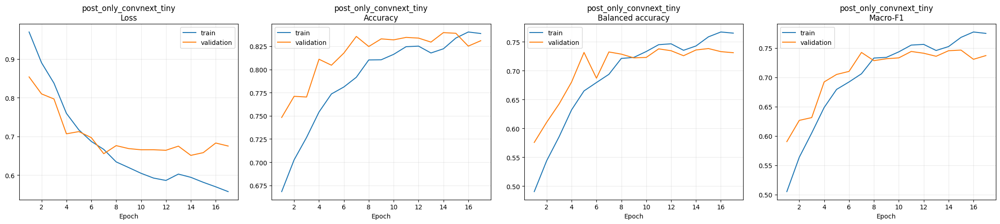

predict:   0%|          | 0/790 [00:00<?, ?it/s]

predict:   0%|          | 0/886 [00:00<?, ?it/s]

              precision    recall  f1-score   support

   no-damage       0.92      0.92      0.92      7056
minor-damage       0.42      0.47      0.45       936
major-damage       0.77      0.78      0.77      1594
   destroyed       0.85      0.72      0.78      1045

    accuracy                           0.84     10631
   macro avg       0.74      0.72      0.73     10631
weighted avg       0.84      0.84      0.84     10631



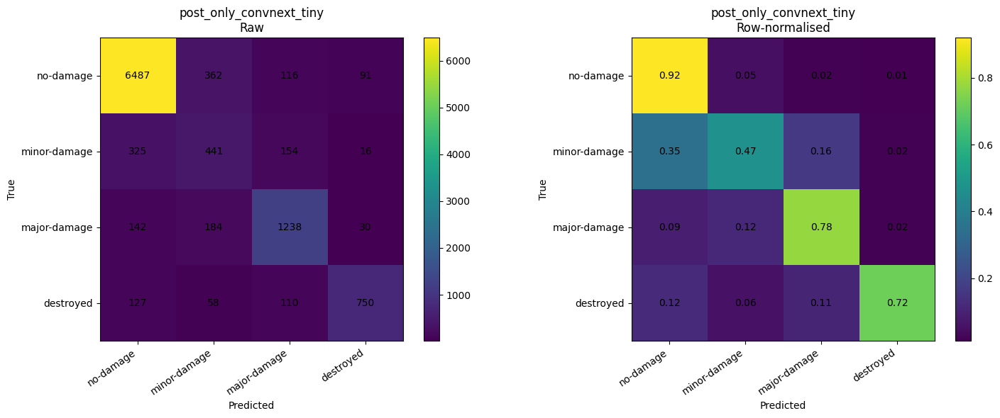


Training change_stack_convnext_tiny
Loaded ConvNeXt-Tiny pretrained weights.
Training stage=head: 397,316/28,226,660 parameters trainable


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 01 [head] | train acc=0.6402 F1=0.4405 | val acc=0.7214 bal=0.4338 F1=0.4524
Saved new best checkpoint.


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 02 [head] | train acc=0.6738 F1=0.5085 | val acc=0.7399 bal=0.5120 F1=0.5488
Saved new best checkpoint.
Training stage=partial: 26,980,868/28,226,660 parameters trainable


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 03 [partial] | train acc=0.6946 F1=0.5514 | val acc=0.7665 bal=0.6179 F1=0.6290
Saved new best checkpoint.


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 04 [partial] | train acc=0.7215 F1=0.6022 | val acc=0.7861 bal=0.6472 F1=0.6550
Saved new best checkpoint.


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 05 [partial] | train acc=0.7434 F1=0.6361 | val acc=0.7725 bal=0.6447 F1=0.6463


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 06 [partial] | train acc=0.7565 F1=0.6572 | val acc=0.7950 bal=0.6535 F1=0.6672
Saved new best checkpoint.


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 07 [partial] | train acc=0.7717 F1=0.6779 | val acc=0.7967 bal=0.6619 F1=0.6729
Saved new best checkpoint.


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 08 [partial] | train acc=0.7797 F1=0.6924 | val acc=0.7986 bal=0.6690 F1=0.6777
Saved new best checkpoint.


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 09 [partial] | train acc=0.7948 F1=0.7130 | val acc=0.7944 bal=0.6606 F1=0.6743


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 10 [partial] | train acc=0.8026 F1=0.7254 | val acc=0.7999 bal=0.6588 F1=0.6732


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 11 [partial] | train acc=0.8052 F1=0.7289 | val acc=0.7932 bal=0.6629 F1=0.6726


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 12 [partial] | train acc=0.8117 F1=0.7375 | val acc=0.7973 bal=0.6666 F1=0.6772
Early stopping within this stage.
Training stage=full: 28,226,660/28,226,660 parameters trainable


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 13 [full] | train acc=0.8035 F1=0.7256 | val acc=0.7973 bal=0.6560 F1=0.6749


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 14 [full] | train acc=0.8109 F1=0.7363 | val acc=0.7975 bal=0.6578 F1=0.6714


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 15 [full] | train acc=0.8135 F1=0.7400 | val acc=0.7980 bal=0.6741 F1=0.6788
Saved new best checkpoint.


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 16 [full] | train acc=0.8143 F1=0.7434 | val acc=0.7994 bal=0.6624 F1=0.6793


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 17 [full] | train acc=0.8267 F1=0.7587 | val acc=0.8022 bal=0.6708 F1=0.6841
Saved new best checkpoint.


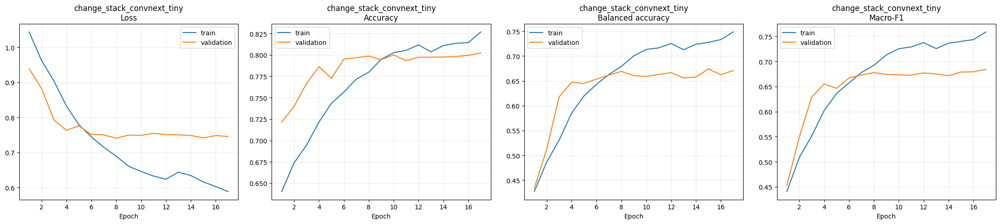

predict:   0%|          | 0/790 [00:00<?, ?it/s]

predict:   0%|          | 0/886 [00:00<?, ?it/s]

              precision    recall  f1-score   support

   no-damage       0.88      0.90      0.89      7056
minor-damage       0.38      0.47      0.42       936
major-damage       0.72      0.66      0.69      1594
   destroyed       0.80      0.64      0.71      1045

    accuracy                           0.80     10631
   macro avg       0.70      0.67      0.68     10631
weighted avg       0.81      0.80      0.80     10631



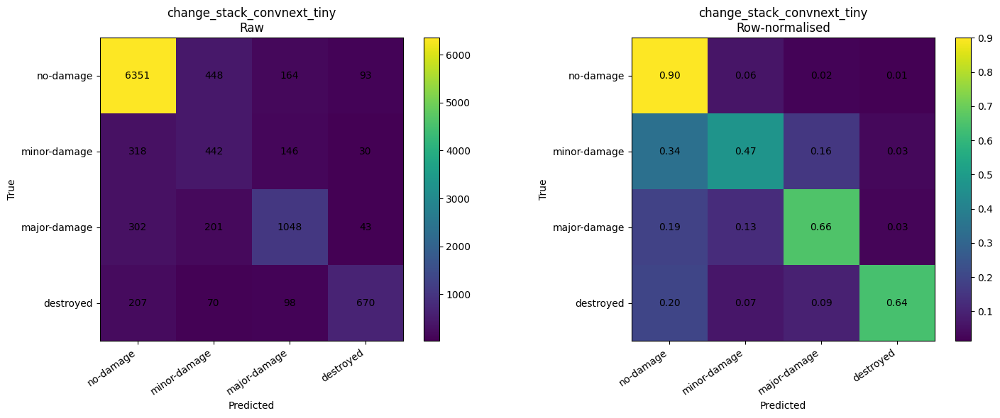


Training siamese_change_convnext_tiny
Loaded ConvNeXt-Tiny pretrained weights.
Training stage=head: 7,876,868/35,696,996 parameters trainable


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 01 [head] | train acc=0.6884 F1=0.5392 | val acc=0.7832 bal=0.6153 F1=0.6314
Saved new best checkpoint.


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 02 [head] | train acc=0.7331 F1=0.6136 | val acc=0.8085 bal=0.6856 F1=0.6972
Saved new best checkpoint.
Training stage=partial: 34,460,420/35,696,996 parameters trainable


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 03 [partial] | train acc=0.7573 F1=0.6534 | val acc=0.8357 bal=0.7496 F1=0.7496
Saved new best checkpoint.


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 04 [partial] | train acc=0.7850 F1=0.6977 | val acc=0.8249 bal=0.7270 F1=0.7150


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 05 [partial] | train acc=0.7980 F1=0.7160 | val acc=0.8295 bal=0.7425 F1=0.7334


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 06 [partial] | train acc=0.8116 F1=0.7369 | val acc=0.8366 bal=0.7274 F1=0.7400


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 07 [partial] | train acc=0.8235 F1=0.7532 | val acc=0.8396 bal=0.7362 F1=0.7485
Early stopping within this stage.
Training stage=full: 35,696,996/35,696,996 parameters trainable


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 08 [full] | train acc=0.8365 F1=0.7716 | val acc=0.8272 bal=0.7392 F1=0.7368


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 09 [full] | train acc=0.8465 F1=0.7860 | val acc=0.8374 bal=0.7470 F1=0.7491


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 10 [full] | train acc=0.8498 F1=0.7902 | val acc=0.8350 bal=0.7378 F1=0.7444


train:   0%|          | 0/3325 [00:00<?, ?it/s]

validate:   0%|          | 0/790 [00:00<?, ?it/s]

Epoch 11 [full] | train acc=0.8539 F1=0.7966 | val acc=0.8313 bal=0.7359 F1=0.7421
Early stopping within this stage.


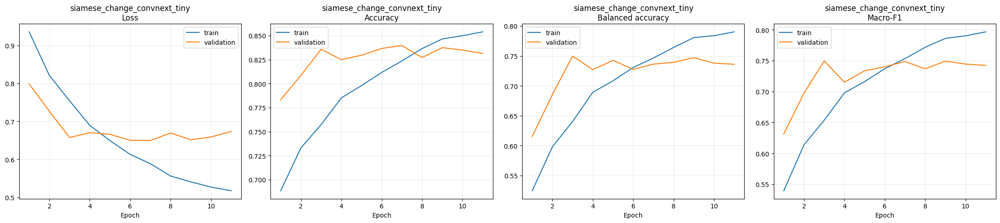

predict:   0%|          | 0/790 [00:00<?, ?it/s]

predict:   0%|          | 0/886 [00:00<?, ?it/s]

              precision    recall  f1-score   support

   no-damage       0.90      0.92      0.91      7056
minor-damage       0.41      0.44      0.42       936
major-damage       0.72      0.71      0.71      1594
   destroyed       0.85      0.69      0.76      1045

    accuracy                           0.82     10631
   macro avg       0.72      0.69      0.70     10631
weighted avg       0.82      0.82      0.82     10631



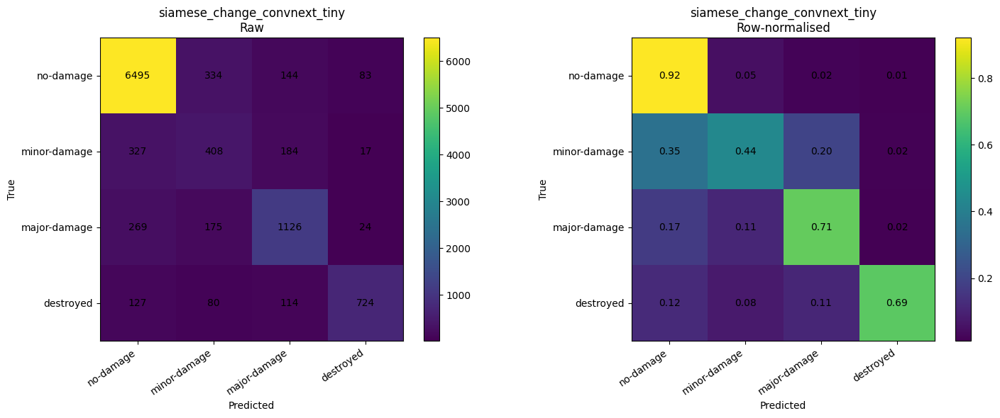

,model,accuracy,balanced_accuracy,macro_f1,weighted_f1,mcc,cohen_kappa,composite_score,precision_no-damage,recall_no-damage,...,f1_destroyed,roc_auc_ovr_macro,best_validation_composite,best_validation_accuracy,best_validation_balanced_accuracy,best_validation_macro_f1,best_epoch,best_stage,split_used,heldout_disaster
0,post_only_convnext_tiny,0.838679,0.721220,0.727555,0.840217,0.688941,0.688714,0.747879,0.916114,0.919359,...,0.776398,0.925812,0.762577,0.838979,0.738384,0.746532,15,full,stratified_scene_grouped_in_domain,None
1,siamese_change_convnext_tiny,0.823347,0.688903,0.702330,0.823160,0.654890,0.654400,0.722505,0.899834,0.920493,...,0.764923,0.920970,0.766831,0.835708,0.749620,0.749608,3,partial,stratified_scene_grouped_in_domain,None
2,change_stack_convnext_tiny,0.800583,0.667730,0.678381,0.802465,0.612735,0.612014,0.699626,0.884787,0.900085,...,0.712387,0.910225,0.703734,0.802153,0.670773,0.684143,17,full,stratified_scene_grouped_in_domain,None


In [26]:
# ============================================================
# 25. Train all models and collect validation/test probabilities
# ============================================================
individual_results = []
checkpoints = {}
models_for_ensemble = {}
validation_probabilities = {}
test_probabilities = {}
prediction_tables = {}

for model_name in MODEL_NAMES:
    gc.collect()
    if DEVICE.type == "cuda":
        torch.cuda.empty_cache()

    model, checkpoint, saved = train_model(model_name)

    (
        val_true,
        val_probs,
        val_ids,
        val_disasters
    ) = predict_probabilities(
        model,
        val_loader,
        tta=USE_TTA
    )

    (
        test_true,
        test_probs,
        test_ids,
        test_disasters
    ) = predict_probabilities(
        model,
        test_loader,
        tta=USE_TTA
    )

    row, table = evaluate_probabilities(
        test_true,
        test_probs,
        model_name,
        test_ids,
        test_disasters
    )
    row.update({
        "best_validation_composite":
            saved["best_validation_composite"],
        "best_validation_accuracy":
            saved["best_validation_accuracy"],
        "best_validation_balanced_accuracy":
            saved["best_validation_balanced_accuracy"],
        "best_validation_macro_f1":
            saved["best_validation_macro_f1"],
        "best_epoch": saved["global_epoch"],
        "best_stage": saved["stage"],
        "split_used": split_used,
        "heldout_disaster": heldout_disaster,
    })

    individual_results.append(row)
    checkpoints[model_name] = str(checkpoint)
    models_for_ensemble[model_name] = model
    validation_probabilities[model_name] = val_probs
    test_probabilities[model_name] = test_probs
    prediction_tables[model_name] = table

results_df = pd.DataFrame(individual_results).sort_values(
    "composite_score",
    ascending=False
).reset_index(drop=True)

display(results_df)
results_df.to_csv(
    TABLE_DIR / "individual_model_results.csv",
    index=False
)


Ensemble order: ['post_only_convnext_tiny', 'change_stack_convnext_tiny', 'siamese_change_convnext_tiny']
Optimised weights: [0.4 0.1 0.5]
Validation metrics: {'accuracy': 0.8554394850691147, 'balanced_accuracy': np.float64(0.765332950396099), 'macro_f1': 0.7729888704316412, 'composite': np.float64(0.7871822173484733)}
              precision    recall  f1-score   support

   no-damage       0.92      0.93      0.92      7056
minor-damage       0.45      0.48      0.46       936
major-damage       0.77      0.77      0.77      1594
   destroyed       0.87      0.73      0.80      1045

    accuracy                           0.85     10631
   macro avg       0.75      0.73      0.74     10631
weighted avg       0.85      0.85      0.85     10631



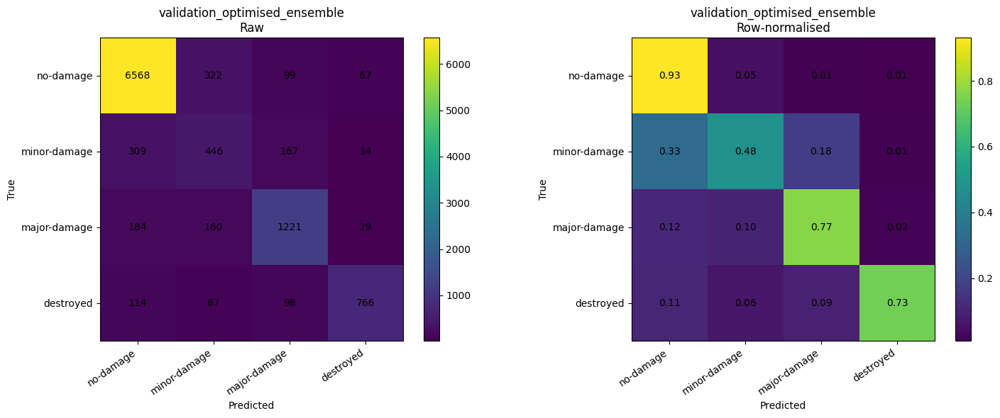

,model,accuracy,balanced_accuracy,macro_f1,weighted_f1,mcc,cohen_kappa,composite_score,precision_no-damage,recall_no-damage,...,f1_destroyed,roc_auc_ovr_macro,best_validation_composite,best_validation_accuracy,best_validation_balanced_accuracy,best_validation_macro_f1,best_epoch,best_stage,split_used,heldout_disaster
0,validation_optimised_ensemble,0.846675,0.726587,0.737665,0.846891,0.701661,0.701326,0.756143,0.915401,0.930839,...,0.797501,0.934698,0.787182,0.855439,0.765333,0.772989,NaN,ensemble,stratified_scene_grouped_in_domain,None
1,post_only_convnext_tiny,0.838679,0.721220,0.727555,0.840217,0.688941,0.688714,0.747879,0.916114,0.919359,...,0.776398,0.925812,0.762577,0.838979,0.738384,0.746532,15.0,full,stratified_scene_grouped_in_domain,None
2,siamese_change_convnext_tiny,0.823347,0.688903,0.702330,0.823160,0.654890,0.654400,0.722505,0.899834,0.920493,...,0.764923,0.920970,0.766831,0.835708,0.749620,0.749608,3.0,partial,stratified_scene_grouped_in_domain,None
3,change_stack_convnext_tiny,0.800583,0.667730,0.678381,0.802465,0.612735,0.612014,0.699626,0.884787,0.900085,...,0.712387,0.910225,0.703734,0.802153,0.670773,0.684143,17.0,full,stratified_scene_grouped_in_domain,None


In [27]:
# ============================================================
# 26. Validation-optimised soft-voting ensemble
# ============================================================
def optimise_ensemble_weights(
    probability_dictionary,
    y_true,
    step=0.10
):
    names = list(probability_dictionary)
    if len(names) != 3:
        equal = np.full(len(names), 1.0 / len(names))
        return names, equal, None

    best_score = -np.inf
    best_weights = None
    best_metrics = None

    grid = np.arange(0.0, 1.0 + 1e-9, step)

    for first_weight in grid:
        for second_weight in grid:
            third_weight = 1.0 - first_weight - second_weight
            if third_weight < -1e-9:
                continue

            weights = np.array([
                first_weight,
                second_weight,
                max(0.0, third_weight)
            ])
            if weights.sum() <= 0:
                continue
            weights /= weights.sum()

            probabilities = sum(
                weights[index] * probability_dictionary[name]
                for index, name in enumerate(names)
            )
            predictions = probabilities.argmax(axis=1)
            score = composite_score(y_true, predictions)

            if score > best_score:
                best_score = score
                best_weights = weights
                best_metrics = {
                    "accuracy": accuracy_score(
                        y_true, predictions
                    ),
                    "balanced_accuracy":
                        balanced_accuracy_score(
                            y_true, predictions
                        ),
                    "macro_f1": f1_compat(
                        y_true, predictions, "macro"
                    ),
                    "composite": score,
                }

    return names, best_weights, best_metrics

ensemble_names, ensemble_weights, ensemble_val_metrics = (
    optimise_ensemble_weights(
        validation_probabilities,
        val_true,
        step=0.10
    )
)

print("Ensemble order:", ensemble_names)
print("Optimised weights:", ensemble_weights)
print("Validation metrics:", ensemble_val_metrics)

ensemble_test_probs = sum(
    ensemble_weights[index] * test_probabilities[name]
    for index, name in enumerate(ensemble_names)
)

ensemble_row, ensemble_table = evaluate_probabilities(
    test_true,
    ensemble_test_probs,
    "validation_optimised_ensemble",
    test_ids,
    test_disasters
)
ensemble_row.update({
    "best_validation_composite":
        ensemble_val_metrics["composite"],
    "best_validation_accuracy":
        ensemble_val_metrics["accuracy"],
    "best_validation_balanced_accuracy":
        ensemble_val_metrics["balanced_accuracy"],
    "best_validation_macro_f1":
        ensemble_val_metrics["macro_f1"],
    "best_epoch": np.nan,
    "best_stage": "ensemble",
    "split_used": split_used,
    "heldout_disaster": heldout_disaster,
})

final_results_df = pd.concat(
    [
        results_df,
        pd.DataFrame([ensemble_row])
    ],
    ignore_index=True
).sort_values(
    "composite_score",
    ascending=False
).reset_index(drop=True)

display(final_results_df)
final_results_df.to_csv(
    TABLE_DIR / "final_model_comparison_results.csv",
    index=False
)


In [28]:
# ============================================================
# 27. Accuracy target gate and honest interpretation
# ============================================================
best_result = final_results_df.iloc[0]

print("=" * 76)
print("BEST RESULT")
print("=" * 76)
print("Model:", best_result["model"])
print("Accuracy:", round(float(best_result["accuracy"]), 4))
print(
    "Balanced accuracy:",
    round(float(best_result["balanced_accuracy"]), 4)
)
print("Macro-F1:", round(float(best_result["macro_f1"]), 4))
print("Experiment mode:", EXPERIMENT_MODE)
print("Split:", split_used)

target_reached = (
    float(best_result["accuracy"]) >= ACCURACY_TARGET
)

quality_gate = (
    float(best_result["balanced_accuracy"]) >= 0.70
    and float(best_result["macro_f1"]) >= 0.70
)

if target_reached and quality_gate:
    print(
        "\nTarget passed: accuracy is at least 80%, and the "
        "balanced metrics are also acceptable."
    )
elif target_reached:
    print(
        "\nRaw accuracy reached 80%, but balanced accuracy or "
        "macro-F1 is below 70%. Do not present the accuracy alone."
    )
else:
    print(
        "\nThe honest test accuracy is below 80%. "
        "Do not change labels, leak scenes, or select the test set "
        "to manufacture a higher result. Increase data, train longer, "
        "or use a larger pretrained backbone."
    )

if EXPERIMENT_MODE == "in_domain":
    print(
        "\nThis is an in-domain result. It must not be described "
        "as unseen-disaster generalisation."
    )
else:
    print(
        "\nThis is a complete-event holdout result and is expected "
        "to be lower than the in-domain score."
    )


BEST RESULT
Model: validation_optimised_ensemble
Accuracy: 0.8467
Balanced accuracy: 0.7266
Macro-F1: 0.7377
Experiment mode: in_domain
Split: stratified_scene_grouped_in_domain

Target passed: accuracy is at least 80%, and the balanced metrics are also acceptable.

This is an in-domain result. It must not be described as unseen-disaster generalisation.


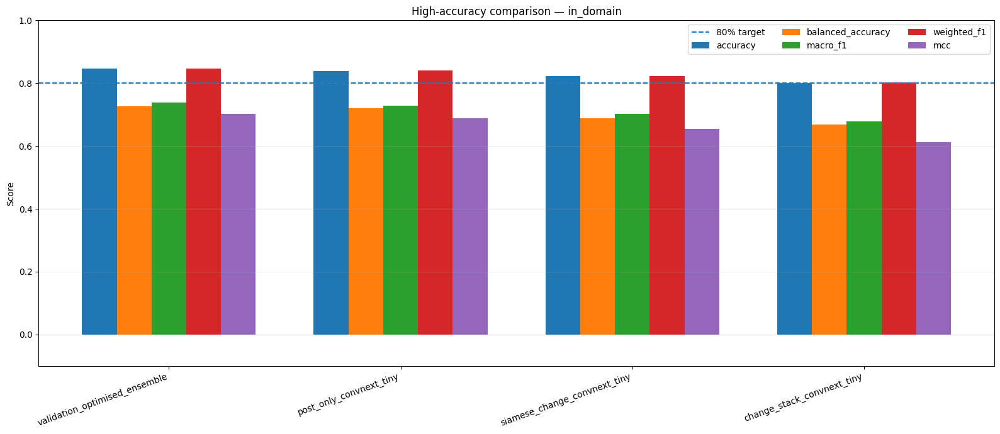

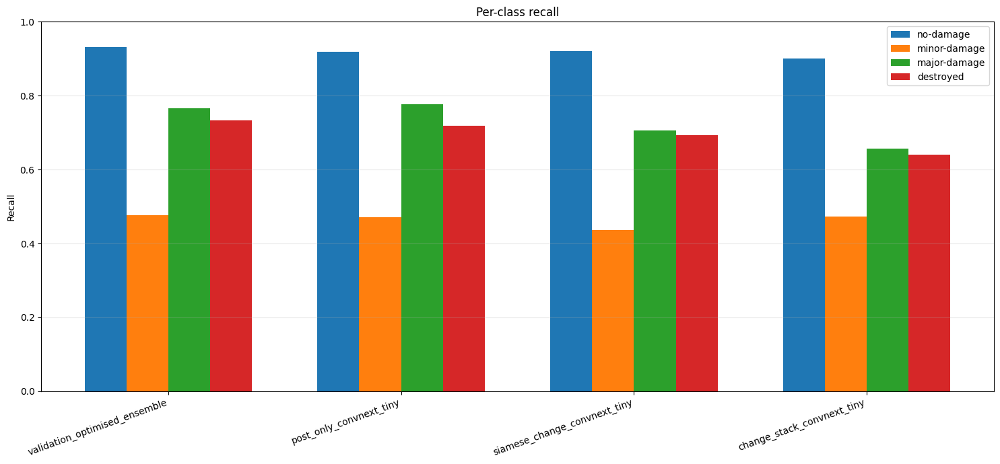

In [29]:
# ============================================================
# 28. Comparison charts
# ============================================================
metrics_to_plot = [
    "accuracy",
    "balanced_accuracy",
    "macro_f1",
    "weighted_f1",
    "mcc",
]

plot_frame = final_results_df.set_index("model")[
    metrics_to_plot
]

fig, ax = plt.subplots(figsize=(16, 7))
x = np.arange(len(plot_frame))
width = 0.15

for index, metric in enumerate(metrics_to_plot):
    ax.bar(
        x + (index - 2) * width,
        plot_frame[metric].values,
        width,
        label=metric,
    )

ax.axhline(
    ACCURACY_TARGET,
    linestyle="--",
    label="80% target"
)
ax.set_xticks(x)
ax.set_xticklabels(
    plot_frame.index,
    rotation=20,
    ha="right"
)
ax.set_ylim(-0.1, 1.0)
ax.set_ylabel("Score")
ax.set_title(
    f"High-accuracy comparison — {EXPERIMENT_MODE}"
)
ax.legend(ncol=3)
ax.grid(axis="y", alpha=0.25)
plt.tight_layout()
plt.savefig(
    FIG_DIR / "high_accuracy_model_comparison.png",
    dpi=170
)
plt.show()

recall_columns = [
    f"recall_{label}"
    for label in DAMAGE_CLASSES
]
recall_frame = final_results_df.set_index("model")[
    recall_columns
]
recall_frame.columns = DAMAGE_CLASSES

fig, ax = plt.subplots(figsize=(15, 7))
x = np.arange(len(recall_frame))
width = 0.18

for index, label in enumerate(DAMAGE_CLASSES):
    ax.bar(
        x + (index - 1.5) * width,
        recall_frame[label].values,
        width,
        label=label,
    )

ax.set_xticks(x)
ax.set_xticklabels(
    recall_frame.index,
    rotation=20,
    ha="right"
)
ax.set_ylim(0, 1)
ax.set_ylabel("Recall")
ax.set_title("Per-class recall")
ax.legend()
ax.grid(axis="y", alpha=0.25)
plt.tight_layout()
plt.savefig(
    FIG_DIR / "high_accuracy_per_class_recall.png",
    dpi=170
)
plt.show()


## H. Explainability

Grad-CAM is generated from the best **single** model, even if the ensemble has the highest score. This avoids implying that a blended probability has one unique visual explanation.


In [30]:
# ============================================================
# 29. Reload best single model for Grad-CAM
# ============================================================
best_single_row = results_df.iloc[0]
BEST_SINGLE_MODEL = best_single_row["model"]

best_model = create_model(
    BEST_SINGLE_MODEL,
    pretrained=False
).to(DEVICE)

best_checkpoint = load_local_checkpoint(
    checkpoints[BEST_SINGLE_MODEL],
    map_location=DEVICE
)
best_model.load_state_dict(
    best_checkpoint["state_dict"]
)
best_model.eval()

def gradcam_layer(model, model_name):
    if model_name == "siamese_change_convnext_tiny":
        return model.shared_backbone.features[-1]
    return model.backbone.features[-1]

class GradCAM:
    def __init__(self, model, layer, model_name):
        self.model = model
        self.layer = layer
        self.model_name = model_name
        self.activations = []
        self.gradients = []

        self.forward_handle = layer.register_forward_hook(
            self._forward_hook
        )
        try:
            self.backward_handle = (
                layer.register_full_backward_hook(
                    self._backward_hook
                )
            )
        except Exception:
            self.backward_handle = layer.register_backward_hook(
                self._backward_hook
            )

    def _forward_hook(self, module, inputs, output):
        self.activations.append(output)

    def _backward_hook(self, module, grad_input, grad_output):
        self.gradients.append(grad_output[0])

    def generate(self, pre, post, target=None):
        self.activations = []
        self.gradients = []
        self.model.zero_grad(set_to_none=True)

        logits = self.model(pre, post)
        if target is None:
            target = int(logits.argmax(dim=1).item())

        logits[:, target].sum().backward()

        if (
            self.model_name
            == "siamese_change_convnext_tiny"
            and len(self.activations) >= 2
        ):
            activation = self.activations[-1]
            gradient = self.gradients[0]
        else:
            activation = self.activations[-1]
            gradient = self.gradients[-1]

        weights = gradient.mean(
            dim=(2, 3),
            keepdim=True
        )
        heatmap = F.relu(
            (weights * activation).sum(
                dim=1,
                keepdim=True
            )
        )
        heatmap = F.interpolate(
            heatmap,
            size=(IMG_SIZE, IMG_SIZE),
            mode="bilinear",
            align_corners=False,
        )[0, 0].detach().cpu().numpy()

        heatmap -= heatmap.min()
        heatmap /= max(heatmap.max(), 1e-8)

        probabilities = torch.softmax(
            logits.detach(),
            dim=1
        )[0].cpu().numpy()

        return heatmap, probabilities, target

    def remove(self):
        self.forward_handle.remove()
        self.backward_handle.remove()

print("Best single model for explainability:", BEST_SINGLE_MODEL)


Best single model for explainability: post_only_convnext_tiny


,crop_id,disaster,true_label,predicted_label,confidence
9528,midwest-flooding_00000066__b0062,midwest-flooding,no-damage,no-damage,0.992263
9408,hurricane-matthew_00000278__b0001,hurricane-matthew,minor-damage,minor-damage,0.995862
6767,hurricane-florence_00000437__b0005,hurricane-florence,major-damage,major-damage,0.999650
3880,socal-fire_00000913__b0007,socal-fire,destroyed,destroyed,0.997800
5814,hurricane-florence_00000475__b0002,hurricane-florence,destroyed,major-damage,0.998937
8450,hurricane-florence_00000475__b0005,hurricane-florence,destroyed,major-damage,0.998220
1150,socal-fire_00000913__b0020,socal-fire,major-damage,destroyed,0.995460
6766,santa-rosa-wildfire_00000283__b0004,santa-rosa-wildfire,minor-damage,destroyed,0.994988


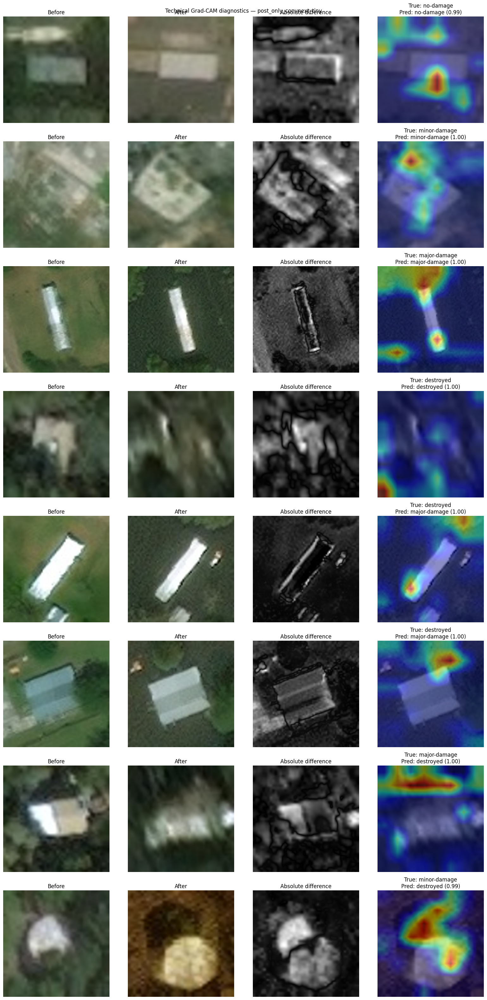

In [31]:
# ============================================================
# 30. Correct and incorrect Grad-CAM examples
# ============================================================
best_single_predictions = prediction_tables[
    BEST_SINGLE_MODEL
]
test_lookup = test_df.set_index("crop_id")

selected_rows = []

for class_id in ALL_LABELS:
    correct = best_single_predictions[
        (best_single_predictions["y_true"] == class_id)
        & (best_single_predictions["y_pred"] == class_id)
    ].sort_values("confidence", ascending=False)
    if len(correct):
        selected_rows.append(correct.iloc[0])

errors = best_single_predictions[
    best_single_predictions["y_true"]
    != best_single_predictions["y_pred"]
].sort_values("confidence", ascending=False)

for _, error_row in errors.head(
    max(0, 8 - len(selected_rows))
).iterrows():
    selected_rows.append(error_row)

selected = pd.DataFrame(selected_rows).head(8)
display(selected[[
    "crop_id",
    "disaster",
    "true_label",
    "predicted_label",
    "confidence",
]])

cam = GradCAM(
    best_model,
    gradcam_layer(
        best_model,
        BEST_SINGLE_MODEL
    ),
    BEST_SINGLE_MODEL
)

fig, axes = plt.subplots(
    len(selected),
    4,
    figsize=(16, max(4, len(selected) * 4))
)
if len(selected) == 1:
    axes = np.array([axes])

for row_index, prediction in selected.reset_index(
    drop=True
).iterrows():
    source = test_lookup.loc[prediction["crop_id"]]

    pre_image = Image.open(
        source["pre_crop_path"]
    ).convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    post_image = Image.open(
        source["post_crop_path"]
    ).convert("RGB").resize((IMG_SIZE, IMG_SIZE))

    pre_tensor = to_tensor(
        pre_image
    ).unsqueeze(0).to(DEVICE)
    post_tensor = to_tensor(
        post_image
    ).unsqueeze(0).to(DEVICE)

    heatmap, probabilities, predicted_class = cam.generate(
        pre_tensor,
        post_tensor
    )

    pre_array = np.asarray(
        pre_image,
        dtype=np.float32
    ) / 255.0
    post_array = np.asarray(
        post_image,
        dtype=np.float32
    ) / 255.0
    difference = np.abs(
        post_array - pre_array
    ).mean(axis=2)

    axes[row_index, 0].imshow(pre_array)
    axes[row_index, 0].set_title("Before")

    axes[row_index, 1].imshow(post_array)
    axes[row_index, 1].set_title("After")

    axes[row_index, 2].imshow(
        difference,
        cmap="gray"
    )
    axes[row_index, 2].set_title(
        "Absolute difference"
    )

    axes[row_index, 3].imshow(post_array)
    axes[row_index, 3].imshow(
        heatmap,
        cmap="jet",
        alpha=0.45
    )
    axes[row_index, 3].set_title(
        f"True: {prediction['true_label']}\n"
        f"Pred: {prediction['predicted_label']} "
        f"({prediction['confidence']:.2f})"
    )

    for axis in axes[row_index]:
        axis.axis("off")

cam.remove()

plt.suptitle(
    f"Technical Grad-CAM diagnostics — {BEST_SINGLE_MODEL}"
)
plt.tight_layout()
plt.savefig(
    FIG_DIR / "gradcam_diagnostics.png",
    dpi=180
)
plt.show()


## I. Flask export

If the ensemble is best, the Flask TorchScript model averages the three model probabilities using the validation-optimised weights. Otherwise, it exports the best single model.


In [32]:
# ============================================================
# 31. Export single model or ensemble to TorchScript
# ============================================================
class ProbabilityEnsemble(nn.Module):
    def __init__(self, models_list, weights):
        super().__init__()
        self.models_list = nn.ModuleList(models_list)
        self.register_buffer(
            "weights",
            torch.tensor(
                weights,
                dtype=torch.float32
            )
        )

    def forward(self, pre, post):
        probability_sum = torch.zeros(
            (pre.size(0), 4),
            device=pre.device
        )
        for index, model in enumerate(self.models_list):
            probability_sum = (
                probability_sum
                + self.weights[index]
                * torch.softmax(
                    model(pre, post),
                    dim=1
                )
            )
        # Return log probabilities so the Flask softmax remains valid.
        return torch.log(
            probability_sum.clamp_min(1e-8)
        )

best_overall_name = str(
    final_results_df.iloc[0]["model"]
)

if best_overall_name == "validation_optimised_ensemble":
    export_models = [
        models_for_ensemble[name].eval()
        for name in ensemble_names
    ]
    export_model = ProbabilityEnsemble(
        export_models,
        ensemble_weights
    ).to(DEVICE).eval()
    export_description = {
        "type": "soft_voting_ensemble",
        "models": ensemble_names,
        "weights": ensemble_weights.tolist(),
    }
else:
    export_model = models_for_ensemble[
        best_overall_name
    ].to(DEVICE).eval()
    export_description = {
        "type": "single_model",
        "model": best_overall_name,
    }

example_pre = torch.zeros(
    1, 3, IMG_SIZE, IMG_SIZE,
    device=DEVICE
)
example_post = torch.zeros(
    1, 3, IMG_SIZE, IMG_SIZE,
    device=DEVICE
)

scripted = torch.jit.trace(
    export_model,
    (example_pre, example_post)
)
scripted_path = (
    MODEL_DIR / "best_damage_model_scripted.pt"
)
scripted.save(str(scripted_path))

configuration = {
    "project_title":
        "Explainable Change-Aware Building Damage Assessment "
        "from Bi-Temporal Satellite Imagery",
    "best_model_name": best_overall_name,
    "export_description": export_description,
    "input_size": IMG_SIZE,
    "class_names": DAMAGE_CLASSES,
    "imagenet_mean": IMAGENET_MEAN.tolist(),
    "imagenet_std": IMAGENET_STD.tolist(),
    "experiment_mode": EXPERIMENT_MODE,
    "split_used": split_used,
    "heldout_disaster": heldout_disaster,
    "accuracy_target": ACCURACY_TARGET,
    "test_accuracy": float(
        final_results_df.iloc[0]["accuracy"]
    ),
    "test_balanced_accuracy": float(
        final_results_df.iloc[0][
            "balanced_accuracy"
        ]
    ),
    "test_macro_f1": float(
        final_results_df.iloc[0]["macro_f1"]
    ),
    "dataset": "xBD/xView2",
    "kaggle_dataset":
        "tunguz/xview2-challenge-dataset-train-and-test",
    "ethics":
        "UREC1 secondary satellite data only; "
        "no human participants.",
}

with open(
    MODEL_DIR / "model_config.json",
    "w",
    encoding="utf-8"
) as file:
    json.dump(configuration, file, indent=2)

print("Saved:", scripted_path)
print(json.dumps(configuration, indent=2))


Saved: /kaggle/working/xbd_80plus_accuracy_in_domain/models/best_damage_model_scripted.pt
{
  "project_title": "Explainable Change-Aware Building Damage Assessment from Bi-Temporal Satellite Imagery",
  "best_model_name": "validation_optimised_ensemble",
  "export_description": {
    "type": "soft_voting_ensemble",
    "models": [
      "post_only_convnext_tiny",
      "change_stack_convnext_tiny",
      "siamese_change_convnext_tiny"
    ],
    "weights": [
      0.4,
      0.1,
      0.5
    ]
  },
  "input_size": 256,
  "class_names": [
    "no-damage",
    "minor-damage",
    "major-damage",
    "destroyed"
  ],
  "imagenet_mean": [
    0.48500001430511475,
    0.4560000002384186,
    0.4059999883174896
  ],
  "imagenet_std": [
    0.2290000021457672,
    0.2240000069141388,
    0.22499999403953552
  ],
  "experiment_mode": "in_domain",
  "split_used": "stratified_scene_grouped_in_domain",
  "heldout_disaster": null,
  "accuracy_target": 0.8,
  "test_accuracy": 0.8466748189257831,


In [33]:
# ============================================================
# 32. Create Flask application package
# ============================================================
(FLASK_DIR / "templates").mkdir(
    parents=True,
    exist_ok=True
)
(FLASK_DIR / "static" / "uploads").mkdir(
    parents=True,
    exist_ok=True
)

shutil.copy2(
    MODEL_DIR / "best_damage_model_scripted.pt",
    FLASK_DIR / "best_damage_model_scripted.pt"
)
shutil.copy2(
    MODEL_DIR / "model_config.json",
    FLASK_DIR / "model_config.json"
)

inference_source = r"""
from pathlib import Path
import json
import numpy as np
from PIL import Image
import torch

BASE_DIR = Path(__file__).resolve().parent
CONFIG = json.loads(
    (BASE_DIR / "model_config.json").read_text(
        encoding="utf-8"
    )
)

CLASS_NAMES = CONFIG["class_names"]
IMAGE_SIZE = int(CONFIG["input_size"])
MEAN = np.array(
    CONFIG["imagenet_mean"],
    dtype=np.float32
)
STD = np.array(
    CONFIG["imagenet_std"],
    dtype=np.float32
)

DEVICE = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)
MODEL = torch.jit.load(
    str(BASE_DIR / "best_damage_model_scripted.pt"),
    map_location=DEVICE
).eval()

def preprocess(path):
    image = Image.open(path).convert("RGB").resize(
        (IMAGE_SIZE, IMAGE_SIZE)
    )
    array = np.asarray(
        image,
        dtype=np.float32
    ) / 255.0
    array = (array - MEAN) / STD
    return torch.from_numpy(
        array.transpose(2, 0, 1)
    ).float().unsqueeze(0).to(DEVICE)

@torch.no_grad()
def predict_damage(pre_path, post_path):
    logits = MODEL(
        preprocess(pre_path),
        preprocess(post_path)
    )
    probabilities = torch.softmax(
        logits,
        dim=1
    )[0].cpu().numpy()
    predicted_id = int(probabilities.argmax())

    return {
        "predicted_class":
            CLASS_NAMES[predicted_id],
        "confidence":
            float(probabilities[predicted_id]),
        "probabilities": {
            label: float(probabilities[index])
            for index, label
            in enumerate(CLASS_NAMES)
        },
    }
"""

app_source = r"""
from pathlib import Path
from uuid import uuid4
from flask import Flask, render_template, request
from werkzeug.utils import secure_filename
from inference import predict_damage

BASE_DIR = Path(__file__).resolve().parent
UPLOAD_DIR = BASE_DIR / "static" / "uploads"
UPLOAD_DIR.mkdir(parents=True, exist_ok=True)

app = Flask(__name__)
app.config["MAX_CONTENT_LENGTH"] = 16 * 1024 * 1024
ALLOWED_EXTENSIONS = {"png", "jpg", "jpeg"}

def allowed(filename):
    return (
        "." in filename
        and filename.rsplit(".", 1)[1].lower()
        in ALLOWED_EXTENSIONS
    )

@app.route("/", methods=["GET", "POST"])
def index():
    result = error = pre_url = post_url = None

    if request.method == "POST":
        pre = request.files.get("pre_image")
        post = request.files.get("post_image")

        if not pre or not post:
            error = "Upload both images."
        elif not allowed(pre.filename) or not allowed(
            post.filename
        ):
            error = "Use PNG, JPG or JPEG."
        else:
            token = uuid4().hex
            pre_name = (
                f"{token}_pre_"
                f"{secure_filename(pre.filename)}"
            )
            post_name = (
                f"{token}_post_"
                f"{secure_filename(post.filename)}"
            )

            pre_path = UPLOAD_DIR / pre_name
            post_path = UPLOAD_DIR / post_name
            pre.save(pre_path)
            post.save(post_path)

            result = predict_damage(
                pre_path,
                post_path
            )
            pre_url = f"/static/uploads/{pre_name}"
            post_url = f"/static/uploads/{post_name}"

    return render_template(
        "index.html",
        result=result,
        error=error,
        pre_url=pre_url,
        post_url=post_url,
    )

if __name__ == "__main__":
    app.run(debug=True)
"""

html_source = r"""
<!doctype html>
<html lang="en">
<head>
<meta charset="utf-8">
<meta name="viewport" content="width=device-width,initial-scale=1">
<title>xBD Building Damage Assessment</title>
<style>
body{font-family:Arial,sans-serif;max-width:980px;margin:35px auto;
padding:20px;background:#f4f6f8;color:#1f2937}
.card{background:white;padding:24px;border-radius:14px;
box-shadow:0 8px 22px #0002;margin-bottom:20px}
.grid{display:grid;grid-template-columns:repeat(auto-fit,minmax(250px,1fr));
gap:18px}
img{width:100%;max-height:320px;object-fit:contain;border-radius:10px}
input,button{width:100%;padding:11px;margin-top:8px;box-sizing:border-box}
button{background:#7a1632;color:white;border:0;border-radius:8px;
font-weight:bold}
table{width:100%;border-collapse:collapse}
td{padding:8px;border-bottom:1px solid #ddd}
.error{color:#b91c1c}
.note{color:#596273;font-size:.92rem}
</style>
</head>
<body>
<div class="card">
<h1>Change-Aware Building Damage Assessment</h1>
<p class="note">Upload matching before and after building crops.</p>
{% if error %}<p class="error">{{error}}</p>{% endif %}
<form method="post" enctype="multipart/form-data">
<div class="grid">
<label>Pre-disaster image
<input type="file" name="pre_image" accept=".png,.jpg,.jpeg" required>
</label>
<label>Post-disaster image
<input type="file" name="post_image" accept=".png,.jpg,.jpeg" required>
</label>
</div>
<button type="submit">Assess damage</button>
</form>
</div>
{% if result %}
<div class="card">
<h2>{{result.predicted_class}} —
{{"%.2f"|format(result.confidence*100)}}%</h2>
<div class="grid">
<img src="{{pre_url}}" alt="Pre-disaster">
<img src="{{post_url}}" alt="Post-disaster">
</div>
<table>
{% for label,p in result.probabilities.items() %}
<tr><td>{{label}}</td><td>{{"%.2f"|format(p*100)}}%</td></tr>
{% endfor %}
</table>
<p class="note">Academic prototype only; not a certified structural assessment.</p>
</div>
{% endif %}
</body>
</html>
"""

(FLASK_DIR / "inference.py").write_text(
    inference_source,
    encoding="utf-8"
)
(FLASK_DIR / "app.py").write_text(
    app_source,
    encoding="utf-8"
)
(FLASK_DIR / "templates" / "index.html").write_text(
    html_source,
    encoding="utf-8"
)
(FLASK_DIR / "requirements.txt").write_text(
    "Flask>=2.2\n"
    "torch\n"
    "torchvision\n"
    "Pillow\n"
    "numpy\n",
    encoding="utf-8"
)
(FLASK_DIR / "README.md").write_text(
    "Install requirements, run `python app.py`, "
    "then open http://127.0.0.1:5000.\n",
    encoding="utf-8"
)

archive = PROJECT_DIR / "xbd_flask_application"
shutil.make_archive(
    str(archive),
    "zip",
    FLASK_DIR
)

print("Flask ZIP:", str(archive) + ".zip")


Flask ZIP: /kaggle/working/xbd_80plus_accuracy_in_domain/xbd_flask_application.zip


In [34]:
# ============================================================
# 33. Reproducibility and output inventory
# ============================================================
run_record = {
    "seed": SEED,
    "device": str(DEVICE),
    "dataset":
        "tunguz/xview2-challenge-dataset-train-and-test",
    "experiment_mode": EXPERIMENT_MODE,
    "accuracy_target": ACCURACY_TARGET,
    "building_crops": len(crop_df),
    "train_samples": len(train_df),
    "validation_samples": len(val_df),
    "test_samples": len(test_df),
    "split_used": split_used,
    "heldout_disaster": heldout_disaster,
    "models": MODEL_NAMES,
    "best_overall_model": best_overall_name,
    "best_test_accuracy":
        float(final_results_df.iloc[0]["accuracy"]),
    "best_test_balanced_accuracy":
        float(
            final_results_df.iloc[0][
                "balanced_accuracy"
            ]
        ),
    "best_test_macro_f1":
        float(final_results_df.iloc[0]["macro_f1"]),
    "ethics":
        "UREC1; secondary satellite data only; "
        "no human participants.",
    "interpretation":
        (
            "In-domain scene-grouped performance"
            if EXPERIMENT_MODE == "in_domain"
            else "Complete unseen-disaster performance"
        ),
}

with open(
    PROJECT_DIR / "run_record.json",
    "w",
    encoding="utf-8"
) as file:
    json.dump(run_record, file, indent=2)

print(json.dumps(run_record, indent=2))

print("\nKey outputs:")
for path in [
    TABLE_DIR / "final_model_comparison_results.csv",
    MODEL_DIR / "best_damage_model_scripted.pt",
    PROJECT_DIR / "xbd_flask_application.zip",
    FIG_DIR,
]:
    print(path)


{
  "seed": 42,
  "device": "cuda",
  "dataset": "tunguz/xview2-challenge-dataset-train-and-test",
  "experiment_mode": "in_domain",
  "accuracy_target": 0.8,
  "building_crops": 60000,
  "train_samples": 39892,
  "validation_samples": 9477,
  "test_samples": 10631,
  "split_used": "stratified_scene_grouped_in_domain",
  "heldout_disaster": null,
  "models": [
    "post_only_convnext_tiny",
    "change_stack_convnext_tiny",
    "siamese_change_convnext_tiny"
  ],
  "best_overall_model": "validation_optimised_ensemble",
  "best_test_accuracy": 0.8466748189257831,
  "best_test_balanced_accuracy": 0.7265866433549993,
  "best_test_macro_f1": 0.7376648783692987,
  "ethics": "UREC1; secondary satellite data only; no human participants.",
  "interpretation": "In-domain scene-grouped performance"
}

Key outputs:
/kaggle/working/xbd_80plus_accuracy_in_domain/tables/final_model_comparison_results.csv
/kaggle/working/xbd_80plus_accuracy_in_domain/models/best_damage_model_scripted.pt
/kaggle/worki

## Reporting rule

An 80%+ in-domain accuracy can support the Flask deployment experiment, but the dissertation must still report:

- balanced accuracy;
- macro-F1;
- per-class recall;
- confusion matrices;
- the exact split protocol;
- the lower cross-event result when `EXPERIMENT_MODE = "cross_event"` is run.

Do not describe the in-domain result as unseen-disaster generalisation.


In [35]:
import os
import zipfile
from pathlib import Path

# Folder to compress
source_folder = Path("/kaggle/working/xbd_80plus_accuracy_in_domain")

# ZIP file location
zip_path = Path("/kaggle/working/xbd_80plus_accuracy_in_domain.zip")

if not source_folder.exists():
    raise FileNotFoundError(f"Folder not found: {source_folder}")

# Remove an incomplete ZIP from a previous attempt
if zip_path.exists():
    zip_path.unlink()

files = [p for p in source_folder.rglob("*") if p.is_file()]
print(f"Found {len(files):,} files.")
print("Creating ZIP file...")

with zipfile.ZipFile(
    zip_path,
    mode="w",
    compression=zipfile.ZIP_DEFLATED,
    compresslevel=6
) as zip_file:

    for index, file_path in enumerate(files, start=1):
        # Preserve the main folder name inside the ZIP
        archive_name = file_path.relative_to(source_folder.parent)
        zip_file.write(file_path, archive_name)

        if index % 100 == 0 or index == len(files):
            print(f"Compressed {index:,}/{len(files):,} files", end="\r")

zip_size_gb = zip_path.stat().st_size / (1024 ** 3)

print("\n\nZIP creation completed successfully.")
print(f"ZIP location: {zip_path}")
print(f"ZIP size: {zip_size_gb:.2f} GB")

Found 120,058 files.
Creating ZIP file...
Compressed 120,058/120,058 files

ZIP creation completed successfully.
ZIP location: /kaggle/working/xbd_80plus_accuracy_in_domain.zip
ZIP size: 1.65 GB


In [36]:
from pathlib import Path

zip_path = Path(
    "/kaggle/working/xbd_80plus_accuracy_in_domain.zip"
)

output_folder = Path(
    "/kaggle/working/xbd_zip_parts"
)

part_size_mb = 400
part_size_bytes = part_size_mb * 1024 * 1024

if not zip_path.exists():
    raise FileNotFoundError(f"ZIP file not found: {zip_path}")

output_folder.mkdir(parents=True, exist_ok=True)

# Delete old parts from previous attempts
for old_part in output_folder.glob("xbd_80plus_accuracy_in_domain.zip.part*"):
    old_part.unlink()

print(f"Original ZIP size: {zip_path.stat().st_size / (1024**3):.2f} GB")
print(f"Splitting into approximately {part_size_mb} MB parts...")

part_number = 1

with open(zip_path, "rb") as source_file:
    while True:
        chunk = source_file.read(part_size_bytes)

        if not chunk:
            break

        part_path = output_folder / (
            f"xbd_80plus_accuracy_in_domain.zip.part{part_number:03d}"
        )

        with open(part_path, "wb") as part_file:
            part_file.write(chunk)

        size_mb = part_path.stat().st_size / (1024**2)
        print(f"Created: {part_path.name} — {size_mb:.2f} MB")

        part_number += 1

print(f"\nCompleted. Created {part_number - 1} parts.")
print(f"Parts location: {output_folder}")

Original ZIP size: 1.65 GB
Splitting into approximately 400 MB parts...
Created: xbd_80plus_accuracy_in_domain.zip.part001 — 400.00 MB
Created: xbd_80plus_accuracy_in_domain.zip.part002 — 400.00 MB
Created: xbd_80plus_accuracy_in_domain.zip.part003 — 400.00 MB
Created: xbd_80plus_accuracy_in_domain.zip.part004 — 400.00 MB
Created: xbd_80plus_accuracy_in_domain.zip.part005 — 90.29 MB

Completed. Created 5 parts.
Parts location: /kaggle/working/xbd_zip_parts


In [37]:
from google.colab import drive 

drive.mount('/content/drive')

NotImplementedError: Mounting drive is unsupported in this environment. Use PyDrive2 instead. See examples at https://colab.research.google.com/notebooks/io.ipynb#scrollTo=7taylj9wpsA2.